# Первая часть
## аналитический отчет для HR-отдела



In [2]:
import psycopg2
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline 
#импортируем модули, указываем отображение



pg_connection = {
    'host': 'dsstudents.skillbox.ru',
    'port': 5432,
    'dbname': 'human_resources',
    'user': 'readonly',
    'password': '6hajV34RTQfmxhS'
}
#параметры подключения
conn = psycopg2.connect(**pg_connection)#подключаемся

hr_dataset = pd.read_sql_query('select * from  hr_dataset;', conn)#выгружаем в виде датафрейма
hr_dataset.head()#смотрим верх

,id,Employee Name,Employee Number,marriedid,maritalstatusid,genderid,empstatus_id,deptid,perf_scoreid,age,...,Date of Hire,Days Employed,Date of Termination,Reason For Term,Employment Status,department,position,Manager Name,Employee Source,Performance Score
0,1,"Brown, Mia",1103024456,1,1,0,1,1,3,30,...,2008-10-27,3317,None,N/A - still employed,Active,Admin Offices,Accountant I,Brandon R. LeBlanc,Diversity Job Fair,Fully Meets
1,2,"LaRotonda, William",1106026572,0,2,1,1,1,3,34,...,2014-01-06,1420,None,N/A - still employed,Active,Admin Offices,Accountant I,Brandon R. LeBlanc,Website Banner Ads,Fully Meets
2,3,"Steans, Tyrone",1302053333,0,0,1,1,1,3,31,...,2014-09-29,1154,None,N/A - still employed,Active,Admin Offices,Accountant I,Brandon R. LeBlanc,Internet Search,Fully Meets
3,4,"Howard, Estelle",1211050782,1,1,0,1,1,9,32,...,2015-02-16,58,2015-04-15,N/A - still employed,Active,Admin Offices,Administrative Assistant,Brandon R. LeBlanc,Pay Per Click - Google,N/A- too early to review
4,5,"Singh, Nan",1307059817,0,0,0,1,1,9,30,...,2015-05-01,940,None,N/A - still employed,Active,Admin Offices,Administrative Assistant,Brandon R. LeBlanc,Website Banner Ads,N/A- too early to review


In [20]:
production_staff = pd.read_sql_query('select * from  production_staff;', conn)
production_staff.head()

,id,Employee Name,Race Desc,Date of Hire,TermDate,Reason for Term,Employment Status,Department,Position,Pay,Manager Name,Performance Score,Abutments/Hour Wk 1,Abutments/Hour Wk 2,Daily Error Rate,90-day Complaints
0,1,"Albert, Michael",White,2011-08-01,None,N/A - still employed,Active,Production,Production Manager,$54.50,Elisa Bramante,Fully Meets,0.0,0.0,0.0,0.0
1,2,"Bozzi, Charles",Asian,2013-09-30,2014-08-07,retiring,Voluntarily Terminated,Production,Production Manager,$50.50,Elisa Bramante,Fully Meets,0.0,0.0,0.0,0.0
2,3,"Butler, Webster L",White,2016-01-28,None,N/A - still employed,Active,Production,Production Manager,$55.00,Elisa Bramante,Exceeds,0.0,0.0,0.0,0.0
3,4,"Dunn, Amy",White,2014-09-18,None,N/A - still employed,Active,Production,Production Manager,$51.00,Elisa Bramante,Fully Meets,0.0,0.0,0.0,0.0
4,5,"Gray, Elijiah",White,2015-06-02,None,N/A - still employed,Active,Production,Production Manager,$54.00,Elisa Bramante,Fully Meets,0.0,0.0,0.0,0.0


In [21]:
recruiting_costs = pd.read_sql_query('select * from  recruiting_costs;', conn)
recruiting_costs.head()

,id,Employment Source,January,February,March,April,May,June,July,August,September,October,November,December,Total
0,1,Billboard,520,520,520,520,0,0,612,612,729,749,910,500,6192
1,2,Careerbuilder,410,410,410,820,820,410,410,820,820,1230,820,410,7790
2,3,Company Intranet - Partner,0,0,0,0,0,0,0,0,0,0,0,0,0
3,4,Diversity Job Fair,0,5129,0,0,0,0,0,4892,0,0,0,0,10021
4,5,Employee Referral,0,0,0,0,0,0,0,0,0,0,0,0,0


In [22]:

salary_grid = pd.read_sql_query('select * from  salary_grid;', conn)
salary_grid.head()

,id,Position,Salary Min,Salary Mid,Salary Max,Hourly Min,Hourly Mid,Hourly Max
0,1,Administrative Assistant,30000,40000,50000,14.42,19.23,24.04
1,2,Sr. Administrative Assistant,35000,45000,55000,16.83,21.63,26.44
2,3,Accountant I,42274,51425,62299,20.32,24.72,29.95
3,4,Accountant II,50490,62158,74658,24.27,29.88,35.89
4,5,Sr. Accountant,63264,76988,92454,30.42,37.01,44.45


In [546]:
pg_connection = {
    'host': 'dsstudents.skillbox.ru',
    'port': 5432,
    'dbname': 'human_resources',
    'user': 'readonly',
    'password': '6hajV34RTQfmxhS'
}


conn = psycopg2.connect(**pg_connection)
cursor = conn.cursor()

#выбираем имена менеджеров и успеваемость
sql_str ='(SELECT "Manager Name", "Performance Score", COUNT("Performance Score") \
FROM hr_dataset WHERE "Manager Name" is not null GROUP BY "Manager Name", "Performance Score" ) UNION \
(SELECT "Manager Name", "Performance Score", COUNT("Performance Score" ) FROM production_staff WHERE "Manager Name" is not null \
GROUP BY "Manager Name", "Performance Score") ORDER BY "Manager Name";'


manager = pd.read_sql_query(sql_str, conn )
    
conn.close()
manager

,Manager Name,Performance Score,count
0,Alex Sweetwater,Fully Meets,4
1,Alex Sweetwater,90-day meets,2
2,Alex Sweetwater,Exceptional,1
3,Alex Sweetwater,Exceeds,1
4,Alex Sweetwater,Needs Improvement,1
...,...,...,...
86,Webster Butler,Fully Meets,11
87,Webster Butler,N/A- too early to review,3
88,Webster Butler,Exceeds,2
89,Webster Butler,90-day meets,3


In [4]:
pg_connection = {
    'host': 'dsstudents.skillbox.ru',
    'port': 5432,
    'dbname': 'human_resources',
    'user': 'readonly',
    'password': '6hajV34RTQfmxhS'
}


conn = psycopg2.connect(**pg_connection)
cursor = conn.cursor()

#выбираем имена менеджеров и успеваемость
sql_str ="""(SELECT "Manager Name", "Performance Score", COUNT("Performance Score") \
FROM hr_dataset WHERE "Manager Name"='Alex Sweetwater' GROUP BY "Manager Name", "Performance Score" ) UNION \
(SELECT "Manager Name", "Performance Score", COUNT("Performance Score" ) FROM production_staff WHERE "Manager Name"='Alex Sweetwater' \
GROUP BY "Manager Name", "Performance Score") ORDER BY "Manager Name";"""


Sweetwater = pd.read_sql_query(sql_str, conn )
    
conn.close()
Sweetwater


,Manager Name,Performance Score,count
0,Alex Sweetwater,Needs Improvement,1
1,Alex Sweetwater,Exceeds,1
2,Alex Sweetwater,Exceptional,1
3,Alex Sweetwater,90-day meets,2
4,Alex Sweetwater,Fully Meets,4


In [5]:
pg_connection = {
    'host': 'dsstudents.skillbox.ru',
    'port': 5432,
    'dbname': 'human_resources',
    'user': 'readonly',
    'password': '6hajV34RTQfmxhS'
}


conn = psycopg2.connect(**pg_connection)
cursor = conn.cursor()

#выбираем имена менеджеров и успеваемость
sql_str ="""(SELECT "Manager Name", "Performance Score", COUNT("Performance Score") \
FROM hr_dataset WHERE "Manager Name"='Amy Dunn' GROUP BY "Manager Name", "Performance Score" ) UNION \
(SELECT "Manager Name", "Performance Score", COUNT("Performance Score" ) FROM production_staff WHERE "Manager Name"='Amy Dunn' \
GROUP BY "Manager Name", "Performance Score") ORDER BY "Manager Name";"""


Dunn = pd.read_sql_query(sql_str, conn )
    
conn.close()
Dunn


,Manager Name,Performance Score,count
0,Amy Dunn,N/A- too early to review,5
1,Amy Dunn,Exceeds,2
2,Amy Dunn,90-day meets,1
3,Amy Dunn,Exceptional,1
4,Amy Dunn,Fully Meets,11
5,Amy Dunn,PIP,1


In [6]:
pg_connection = {
    'host': 'dsstudents.skillbox.ru',
    'port': 5432,
    'dbname': 'human_resources',
    'user': 'readonly',
    'password': '6hajV34RTQfmxhS'
}


conn = psycopg2.connect(**pg_connection)
cursor = conn.cursor()

#выбираем имена менеджеров и успеваемость
sql_str ="""(SELECT "Manager Name", "Performance Score", COUNT("Performance Score") \
FROM hr_dataset WHERE "Manager Name"='Board of Directors' GROUP BY "Manager Name", "Performance Score" ) UNION \
(SELECT "Manager Name", "Performance Score", COUNT("Performance Score" ) FROM production_staff WHERE "Manager Name"='Board of Directors' \
GROUP BY "Manager Name", "Performance Score") ORDER BY "Manager Name";"""


Board_of_Directors = pd.read_sql_query(sql_str, conn )
    
conn.close()
Board_of_Directors


,Manager Name,Performance Score,count
0,Board of Directors,Fully Meets,2


In [7]:
pg_connection = {
    'host': 'dsstudents.skillbox.ru',
    'port': 5432,
    'dbname': 'human_resources',
    'user': 'readonly',
    'password': '6hajV34RTQfmxhS'
}


conn = psycopg2.connect(**pg_connection)
cursor = conn.cursor()

#выбираем имена менеджеров и успеваемость
sql_str ="""(SELECT "Manager Name", "Performance Score", COUNT("Performance Score") \
FROM hr_dataset WHERE "Manager Name"='Brandon R. LeBlanc' GROUP BY "Manager Name", "Performance Score" ) UNION \
(SELECT "Manager Name", "Performance Score", COUNT("Performance Score" ) FROM production_staff WHERE "Manager Name"='Brandon R. LeBlanc' \
GROUP BY "Manager Name", "Performance Score") ORDER BY "Manager Name";"""


LeBlanc = pd.read_sql_query(sql_str, conn )
    
conn.close()
LeBlanc


,Manager Name,Performance Score,count
0,Brandon R. LeBlanc,Fully Meets,4
1,Brandon R. LeBlanc,90-day meets,1
2,Brandon R. LeBlanc,N/A- too early to review,2


In [8]:
pg_connection = {
    'host': 'dsstudents.skillbox.ru',
    'port': 5432,
    'dbname': 'human_resources',
    'user': 'readonly',
    'password': '6hajV34RTQfmxhS'
}


conn = psycopg2.connect(**pg_connection)
cursor = conn.cursor()

#выбираем имена менеджеров и успеваемость
sql_str ="""(SELECT "Manager Name", "Performance Score", COUNT("Performance Score") \
FROM hr_dataset WHERE "Manager Name"='Brannon Miller' GROUP BY "Manager Name", "Performance Score" ) UNION \
(SELECT "Manager Name", "Performance Score", COUNT("Performance Score" ) FROM production_staff WHERE "Manager Name"='Brannon Miller' \
GROUP BY "Manager Name", "Performance Score") ORDER BY "Manager Name";"""


Miller = pd.read_sql_query(sql_str, conn )
    
conn.close()
Miller


,Manager Name,Performance Score,count
0,Brannon Miller,PIP,4
1,Brannon Miller,Fully Meets,8
2,Brannon Miller,Exceeds,5
3,Brannon Miller,Exceptional,2
4,Brannon Miller,90-day meets,1
5,Brannon Miller,Needs Improvement,1


In [9]:
pg_connection = {
    'host': 'dsstudents.skillbox.ru',
    'port': 5432,
    'dbname': 'human_resources',
    'user': 'readonly',
    'password': '6hajV34RTQfmxhS'
}


conn = psycopg2.connect(**pg_connection)
cursor = conn.cursor()

#выбираем имена менеджеров и успеваемость
sql_str ="""(SELECT "Manager Name", "Performance Score", COUNT("Performance Score") \
FROM hr_dataset WHERE "Manager Name"='Brian Champaigne' GROUP BY "Manager Name", "Performance Score" ) UNION \
(SELECT "Manager Name", "Performance Score", COUNT("Performance Score" ) FROM production_staff WHERE "Manager Name"='Brian Champaigne' \
GROUP BY "Manager Name", "Performance Score") ORDER BY "Manager Name";"""


Champaigne = pd.read_sql_query(sql_str, conn )
    
conn.close()
Champaigne


,Manager Name,Performance Score,count
0,Brian Champaigne,Fully Meets,8


In [10]:
pg_connection = {
    'host': 'dsstudents.skillbox.ru',
    'port': 5432,
    'dbname': 'human_resources',
    'user': 'readonly',
    'password': '6hajV34RTQfmxhS'
}


conn = psycopg2.connect(**pg_connection)
cursor = conn.cursor()

#выбираем имена менеджеров и успеваемость
sql_str ="""(SELECT "Manager Name", "Performance Score", COUNT("Performance Score") \
FROM hr_dataset WHERE "Manager Name"='David Stanley' GROUP BY "Manager Name", "Performance Score" ) UNION \
(SELECT "Manager Name", "Performance Score", COUNT("Performance Score" ) FROM production_staff WHERE "Manager Name"='David Stanley' \
GROUP BY "Manager Name", "Performance Score") ORDER BY "Manager Name";"""


Stanley = pd.read_sql_query(sql_str, conn )
    
conn.close()
Stanley


,Manager Name,Performance Score,count
0,David Stanley,Exceeds,1
1,David Stanley,90-day meets,1
2,David Stanley,Fully Meets,15
3,David Stanley,N/A- too early to review,4


In [11]:
pg_connection = {
    'host': 'dsstudents.skillbox.ru',
    'port': 5432,
    'dbname': 'human_resources',
    'user': 'readonly',
    'password': '6hajV34RTQfmxhS'
}


conn = psycopg2.connect(**pg_connection)
cursor = conn.cursor()

#выбираем имена менеджеров и успеваемость
sql_str ="""(SELECT "Manager Name", "Performance Score", COUNT("Performance Score") \
FROM hr_dataset WHERE "Manager Name"='Debra Houlihan' GROUP BY "Manager Name", "Performance Score" ) UNION \
(SELECT "Manager Name", "Performance Score", COUNT("Performance Score" ) FROM production_staff WHERE "Manager Name"='Debra Houlihan' \
GROUP BY "Manager Name", "Performance Score") ORDER BY "Manager Name";"""


Houlihan = pd.read_sql_query(sql_str, conn )
    
conn.close()
Houlihan


,Manager Name,Performance Score,count
0,Debra Houlihan,Needs Improvement,1
1,Debra Houlihan,Fully Meets,2


In [12]:
pg_connection = {
    'host': 'dsstudents.skillbox.ru',
    'port': 5432,
    'dbname': 'human_resources',
    'user': 'readonly',
    'password': '6hajV34RTQfmxhS'
}


conn = psycopg2.connect(**pg_connection)
cursor = conn.cursor()

#выбираем имена менеджеров и успеваемость
sql_str ="""(SELECT "Manager Name", "Performance Score", COUNT("Performance Score") \
FROM hr_dataset WHERE "Manager Name"='Elijiah Gray' GROUP BY "Manager Name", "Performance Score" ) UNION \
(SELECT "Manager Name", "Performance Score", COUNT("Performance Score" ) FROM production_staff WHERE "Manager Name"='Elijiah Gray' \
GROUP BY "Manager Name", "Performance Score") ORDER BY "Manager Name";"""


Gray = pd.read_sql_query(sql_str, conn )
    
conn.close()
Gray


,Manager Name,Performance Score,count
0,Elijiah Gray,Exceeds,2
1,Elijiah Gray,N/A- too early to review,3
2,Elijiah Gray,Fully Meets,13
3,Elijiah Gray,90-day meets,3
4,Elijiah Gray,Needs Improvement,1
5,Elijiah Gray,Fully Meets,14


In [13]:
pg_connection = {
    'host': 'dsstudents.skillbox.ru',
    'port': 5432,
    'dbname': 'human_resources',
    'user': 'readonly',
    'password': '6hajV34RTQfmxhS'
}


conn = psycopg2.connect(**pg_connection)
cursor = conn.cursor()

#выбираем имена менеджеров и успеваемость
sql_str ="""(SELECT "Manager Name", "Performance Score", COUNT("Performance Score") \
FROM hr_dataset WHERE "Manager Name"='Elisa Bramante' GROUP BY "Manager Name", "Performance Score" ) UNION \
(SELECT "Manager Name", "Performance Score", COUNT("Performance Score" ) FROM production_staff WHERE "Manager Name"='Elisa Bramante' \
GROUP BY "Manager Name", "Performance Score") ORDER BY "Manager Name";"""


Bramante = pd.read_sql_query(sql_str, conn )
    
conn.close()
Bramante


,Manager Name,Performance Score,count
0,Elisa Bramante,Exceeds,2
1,Elisa Bramante,Fully Meets,10
2,Elisa Bramante,Needs Improvement,2


In [15]:
pg_connection = {
    'host': 'dsstudents.skillbox.ru',
    'port': 5432,
    'dbname': 'human_resources',
    'user': 'readonly',
    'password': '6hajV34RTQfmxhS'
}


conn = psycopg2.connect(**pg_connection)
cursor = conn.cursor()

#выбираем имена менеджеров и успеваемость
sql_str ="""(SELECT "Manager Name", "Performance Score", COUNT("Performance Score") \
FROM hr_dataset WHERE "Manager Name"='Eric Dougall' GROUP BY "Manager Name", "Performance Score" ) UNION \
(SELECT "Manager Name", "Performance Score", COUNT("Performance Score" ) FROM production_staff WHERE "Manager Name"='Eric Dougall' \
GROUP BY "Manager Name", "Performance Score") ORDER BY "Manager Name";"""


Dougall = pd.read_sql_query(sql_str, conn )
    
conn.close()
Dougall


,Manager Name,Performance Score,count
0,Eric Dougall,Exceeds,1
1,Eric Dougall,Fully Meets,3


In [17]:
pg_connection = {
    'host': 'dsstudents.skillbox.ru',
    'port': 5432,
    'dbname': 'human_resources',
    'user': 'readonly',
    'password': '6hajV34RTQfmxhS'
}


conn = psycopg2.connect(**pg_connection)
cursor = conn.cursor()

#выбираем имена менеджеров и успеваемость
sql_str ="""(SELECT "Manager Name", "Performance Score", COUNT("Performance Score") \
FROM hr_dataset WHERE "Manager Name"='Janet King' GROUP BY "Manager Name", "Performance Score" ) UNION \
(SELECT "Manager Name", "Performance Score", COUNT("Performance Score" ) FROM production_staff WHERE "Manager Name"='Janet King' \
GROUP BY "Manager Name", "Performance Score") ORDER BY "Manager Name";"""


King = pd.read_sql_query(sql_str, conn )
    
conn.close()
King


,Manager Name,Performance Score,count
0,Janet King,Needs Improvement,2
1,Janet King,Exceptional,1
2,Janet King,Fully Meets,13
3,Janet King,Exceeds,3


In [18]:
pg_connection = {
    'host': 'dsstudents.skillbox.ru',
    'port': 5432,
    'dbname': 'human_resources',
    'user': 'readonly',
    'password': '6hajV34RTQfmxhS'
}


conn = psycopg2.connect(**pg_connection)
cursor = conn.cursor()

#выбираем имена менеджеров и успеваемость
sql_str ="""(SELECT "Manager Name", "Performance Score", COUNT("Performance Score") \
FROM hr_dataset WHERE "Manager Name"='Jennifer Zamora' GROUP BY "Manager Name", "Performance Score" ) UNION \
(SELECT "Manager Name", "Performance Score", COUNT("Performance Score" ) FROM production_staff WHERE "Manager Name"='Jennifer Zamora' \
GROUP BY "Manager Name", "Performance Score") ORDER BY "Manager Name";"""


Zamora = pd.read_sql_query(sql_str, conn )
    
conn.close()
Zamora


,Manager Name,Performance Score,count
0,Jennifer Zamora,Needs Improvement,1
1,Jennifer Zamora,Exceptional,1
2,Jennifer Zamora,Exceeds,1
3,Jennifer Zamora,Fully Meets,4


In [19]:
pg_connection = {
    'host': 'dsstudents.skillbox.ru',
    'port': 5432,
    'dbname': 'human_resources',
    'user': 'readonly',
    'password': '6hajV34RTQfmxhS'
}


conn = psycopg2.connect(**pg_connection)
cursor = conn.cursor()

#выбираем имена менеджеров и успеваемость
sql_str ="""(SELECT "Manager Name", "Performance Score", COUNT("Performance Score") \
FROM hr_dataset WHERE "Manager Name"='John Smith' GROUP BY "Manager Name", "Performance Score" ) UNION \
(SELECT "Manager Name", "Performance Score", COUNT("Performance Score" ) FROM production_staff WHERE "Manager Name"='John Smith' \
GROUP BY "Manager Name", "Performance Score") ORDER BY "Manager Name";"""


Smith = pd.read_sql_query(sql_str, conn )
    
conn.close()
Smith


,Manager Name,Performance Score,count
0,John Smith,Fully Meets,11
1,John Smith,90-day meets,1
2,John Smith,PIP,1
3,John Smith,Needs Improvement,1


In [20]:
pg_connection = {
    'host': 'dsstudents.skillbox.ru',
    'port': 5432,
    'dbname': 'human_resources',
    'user': 'readonly',
    'password': '6hajV34RTQfmxhS'
}


conn = psycopg2.connect(**pg_connection)
cursor = conn.cursor()

#выбираем имена менеджеров и успеваемость
sql_str ="""(SELECT "Manager Name", "Performance Score", COUNT("Performance Score") \
FROM hr_dataset WHERE "Manager Name"='Kelley Spirea' GROUP BY "Manager Name", "Performance Score" ) UNION \
(SELECT "Manager Name", "Performance Score", COUNT("Performance Score" ) FROM production_staff WHERE "Manager Name"='Kelley Spirea' \
GROUP BY "Manager Name", "Performance Score") ORDER BY "Manager Name";"""


Spirea = pd.read_sql_query(sql_str, conn )
    
conn.close()
Spirea


,Manager Name,Performance Score,count
0,Kelley Spirea,Exceeds,3
1,Kelley Spirea,Fully Meets,15
2,Kelley Spirea,90-day meets,3
3,Kelley Spirea,N/A- too early to review,1


In [21]:
pg_connection = {
    'host': 'dsstudents.skillbox.ru',
    'port': 5432,
    'dbname': 'human_resources',
    'user': 'readonly',
    'password': '6hajV34RTQfmxhS'
}


conn = psycopg2.connect(**pg_connection)
cursor = conn.cursor()

#выбираем имена менеджеров и успеваемость
sql_str ="""(SELECT "Manager Name", "Performance Score", COUNT("Performance Score") \
FROM hr_dataset WHERE "Manager Name"='Ketsia Liebig' GROUP BY "Manager Name", "Performance Score" ) UNION \
(SELECT "Manager Name", "Performance Score", COUNT("Performance Score" ) FROM production_staff WHERE "Manager Name"='Ketsia Liebig' \
GROUP BY "Manager Name", "Performance Score") ORDER BY "Manager Name";"""


Liebig = pd.read_sql_query(sql_str, conn )
    
conn.close()
Liebig


,Manager Name,Performance Score,count
0,Ketsia Liebig,Exceeds,2
1,Ketsia Liebig,Needs Improvement,1
2,Ketsia Liebig,Fully Meets,14
3,Ketsia Liebig,N/A- too early to review,2
4,Ketsia Liebig,90-day meets,2


In [22]:
pg_connection = {
    'host': 'dsstudents.skillbox.ru',
    'port': 5432,
    'dbname': 'human_resources',
    'user': 'readonly',
    'password': '6hajV34RTQfmxhS'
}


conn = psycopg2.connect(**pg_connection)
cursor = conn.cursor()

#выбираем имена менеджеров и успеваемость
sql_str ="""(SELECT "Manager Name", "Performance Score", COUNT("Performance Score") \
FROM hr_dataset WHERE "Manager Name"='Kissy Sullivan' GROUP BY "Manager Name", "Performance Score" ) UNION \
(SELECT "Manager Name", "Performance Score", COUNT("Performance Score" ) FROM production_staff WHERE "Manager Name"='Kissy Sullivan' \
GROUP BY "Manager Name", "Performance Score") ORDER BY "Manager Name";"""


Sullivan = pd.read_sql_query(sql_str, conn )
    
conn.close()
Sullivan



,Manager Name,Performance Score,count
0,Kissy Sullivan,N/A- too early to review,1
1,Kissy Sullivan,Needs Improvement,1
2,Kissy Sullivan,Fully Meets,14
3,Kissy Sullivan,Exceptional,1
4,Kissy Sullivan,Exceeds,1
5,Kissy Sullivan,PIP,1
6,Kissy Sullivan,90-day meets,3


In [23]:
pg_connection = {
    'host': 'dsstudents.skillbox.ru',
    'port': 5432,
    'dbname': 'human_resources',
    'user': 'readonly',
    'password': '6hajV34RTQfmxhS'
}


conn = psycopg2.connect(**pg_connection)
cursor = conn.cursor()

#выбираем имена менеджеров и успеваемость
sql_str ="""(SELECT "Manager Name", "Performance Score", COUNT("Performance Score") \
FROM hr_dataset WHERE "Manager Name"='Lynn Daneault' GROUP BY "Manager Name", "Performance Score" ) UNION \
(SELECT "Manager Name", "Performance Score", COUNT("Performance Score" ) FROM production_staff WHERE "Manager Name"='Lynn Daneault' \
GROUP BY "Manager Name", "Performance Score") ORDER BY "Manager Name";"""


Daneault = pd.read_sql_query(sql_str, conn )
    
conn.close()
Daneault


,Manager Name,Performance Score,count
0,Lynn Daneault,Fully Meets,8
1,Lynn Daneault,PIP,1
2,Lynn Daneault,Exceeds,2
3,Lynn Daneault,90-day meets,1
4,Lynn Daneault,N/A- too early to review,1


In [28]:
pg_connection = {
    'host': 'dsstudents.skillbox.ru',
    'port': 5432,
    'dbname': 'human_resources',
    'user': 'readonly',
    'password': '6hajV34RTQfmxhS'
}


conn = psycopg2.connect(**pg_connection)
cursor = conn.cursor()

#выбираем имена менеджеров и успеваемость
sql_str ="""(SELECT "Manager Name", "Performance Score", COUNT("Performance Score") \
FROM hr_dataset WHERE "Manager Name"='Michael Albert' GROUP BY "Manager Name", "Performance Score" ) UNION \
(SELECT "Manager Name", "Performance Score", COUNT("Performance Score" ) FROM production_staff WHERE "Manager Name"='Michael Albert' \
GROUP BY "Manager Name", "Performance Score") ORDER BY "Manager Name";"""


Albert = pd.read_sql_query(sql_str, conn )
    
conn.close()
Albert


,Manager Name,Performance Score,count
0,Michael Albert,90-day meets,1
1,Michael Albert,Fully Meets,10
2,Michael Albert,PIP,1
3,Michael Albert,Exceeds,2
4,Michael Albert,Fully Meets,9
5,Michael Albert,N/A- too early to review,6
6,Michael Albert,Needs Improvement,3


In [25]:
pg_connection = {
    'host': 'dsstudents.skillbox.ru',
    'port': 5432,
    'dbname': 'human_resources',
    'user': 'readonly',
    'password': '6hajV34RTQfmxhS'
}


conn = psycopg2.connect(**pg_connection)
cursor = conn.cursor()

#выбираем имена менеджеров и успеваемость
sql_str ="""(SELECT "Manager Name", "Performance Score", COUNT("Performance Score") \
FROM hr_dataset WHERE "Manager Name"='Peter Monroe' GROUP BY "Manager Name", "Performance Score" ) UNION \
(SELECT "Manager Name", "Performance Score", COUNT("Performance Score" ) FROM production_staff WHERE "Manager Name"='Peter Monroe' \
GROUP BY "Manager Name", "Performance Score") ORDER BY "Manager Name";"""


Monroe = pd.read_sql_query(sql_str, conn )
    
conn.close()
Monroe


,Manager Name,Performance Score,count
0,Peter Monroe,N/A- too early to review,5
1,Peter Monroe,90-day meets,3
2,Peter Monroe,Fully Meets,6


In [26]:
pg_connection = {
    'host': 'dsstudents.skillbox.ru',
    'port': 5432,
    'dbname': 'human_resources',
    'user': 'readonly',
    'password': '6hajV34RTQfmxhS'
}


conn = psycopg2.connect(**pg_connection)
cursor = conn.cursor()

#выбираем имена менеджеров и успеваемость
sql_str ="""(SELECT "Manager Name", "Performance Score", COUNT("Performance Score") \
FROM hr_dataset WHERE "Manager Name"='Simon Roup' GROUP BY "Manager Name", "Performance Score" ) UNION \
(SELECT "Manager Name", "Performance Score", COUNT("Performance Score" ) FROM production_staff WHERE "Manager Name"='Simon Roup' \
GROUP BY "Manager Name", "Performance Score") ORDER BY "Manager Name";"""


Roup = pd.read_sql_query(sql_str, conn )
    
conn.close()
Roup


,Manager Name,Performance Score,count
0,Simon Roup,Exceptional,2
1,Simon Roup,N/A- too early to review,4
2,Simon Roup,Fully Meets,6
3,Simon Roup,90-day meets,5


In [27]:
pg_connection = {
    'host': 'dsstudents.skillbox.ru',
    'port': 5432,
    'dbname': 'human_resources',
    'user': 'readonly',
    'password': '6hajV34RTQfmxhS'
}


conn = psycopg2.connect(**pg_connection)
cursor = conn.cursor()

#выбираем имена менеджеров и успеваемость
sql_str ="""(SELECT "Manager Name", "Performance Score", COUNT("Performance Score") \
FROM hr_dataset WHERE "Manager Name"='Webster Butler' GROUP BY "Manager Name", "Performance Score" ) UNION \
(SELECT "Manager Name", "Performance Score", COUNT("Performance Score" ) FROM production_staff WHERE "Manager Name"='Webster Butler' \
GROUP BY "Manager Name", "Performance Score") ORDER BY "Manager Name";"""


Butler = pd.read_sql_query(sql_str, conn )
    
conn.close()
Butler


,Manager Name,Performance Score,count
0,Webster Butler,Exceeds,2
1,Webster Butler,Needs Improvement,2
2,Webster Butler,Fully Meets,11
3,Webster Butler,90-day meets,3
4,Webster Butler,N/A- too early to review,3


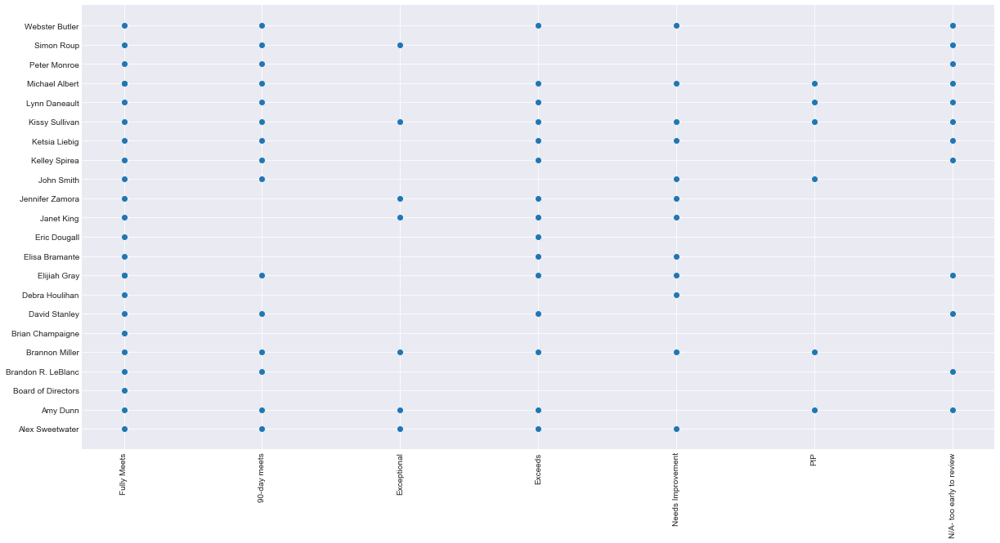

In [267]:
fig, subplot = plt.subplots(figsize=(20, 10))


plt.xticks(rotation='vertical')
subplot.scatter(x=manager['Performance Score'], 
                y=manager['Manager Name'])



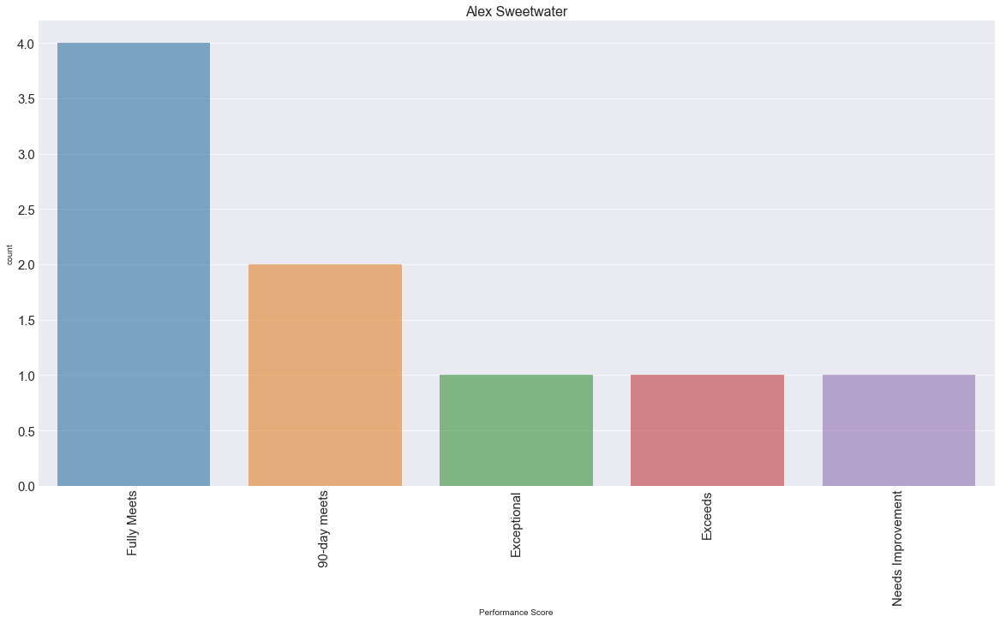

In [553]:

plt.figure(figsize=(20, 10))
plt.tick_params(labelsize=15)
plt.title("Alex Sweetwater", fontsize=16)
plt.xticks(rotation='vertical')

sns.barplot(y=Sweetwater['count'], x=Sweetwater['Performance Score'], alpha=0.6, orient='v')
plt.show()

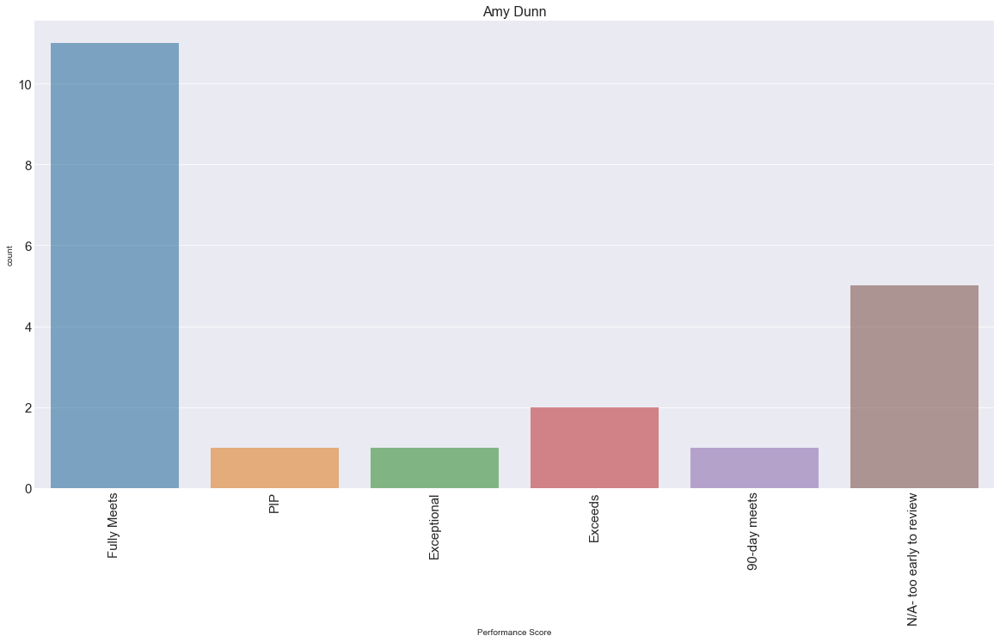

In [554]:

plt.figure(figsize=(20, 10))
plt.tick_params(labelsize=15)
plt.title("Amy Dunn", fontsize=16)
plt.xticks(rotation='vertical')

sns.barplot(y=Dunn['count'], x=Dunn['Performance Score'], alpha=0.6, orient='v')
plt.show()

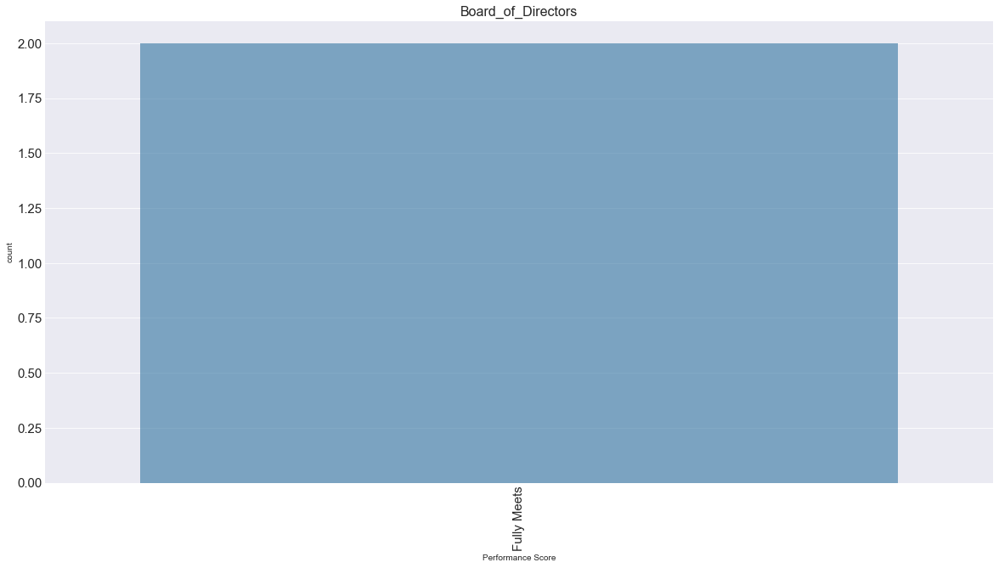

In [555]:

plt.figure(figsize=(20, 10))
plt.tick_params(labelsize=15)
plt.title("Board_of_Directors", fontsize=16)
plt.xticks(rotation='vertical')

sns.barplot(y=Board_of_Directors['count'], x=Board_of_Directors['Performance Score'], alpha=0.6, orient='v')
plt.show()

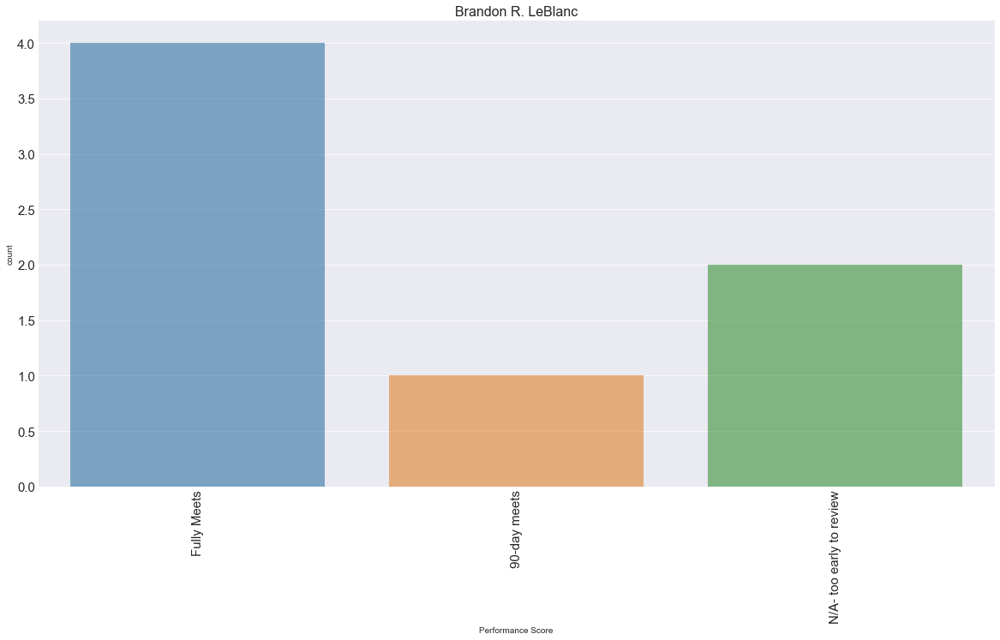

In [556]:

plt.figure(figsize=(20, 10))
plt.tick_params(labelsize=15)
plt.title("Brandon R. LeBlanc", fontsize=16)
plt.xticks(rotation='vertical')

sns.barplot(y=LeBlanc['count'], x=LeBlanc['Performance Score'], alpha=0.6, orient='v')
plt.show()

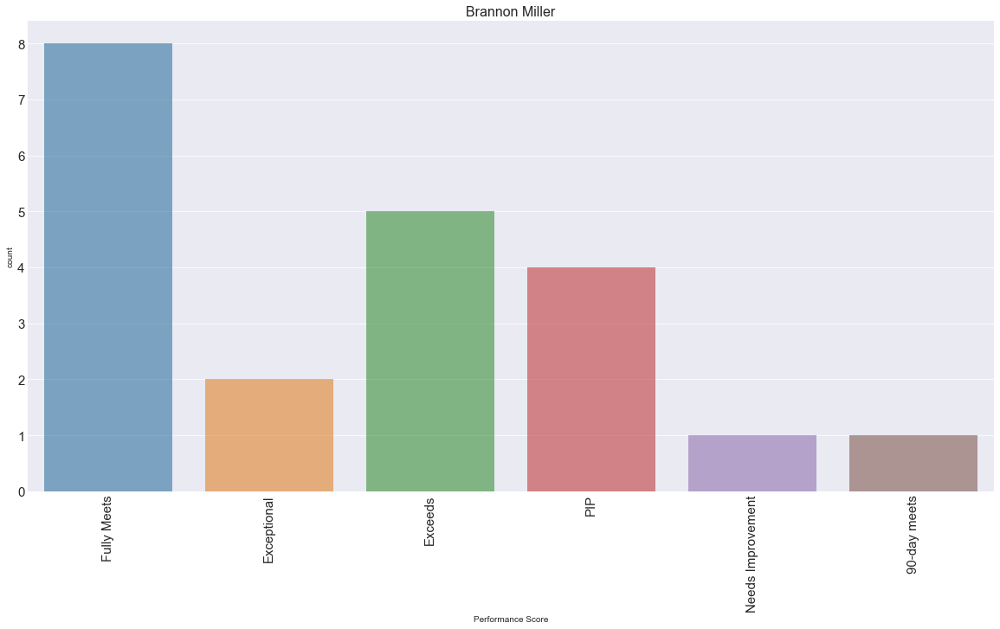

In [557]:

plt.figure(figsize=(20, 10))
plt.tick_params(labelsize=15)
plt.title("Brannon Miller", fontsize=16)
plt.xticks(rotation='vertical')

sns.barplot(y=Miller['count'], x=Miller['Performance Score'], alpha=0.6, orient='v')
plt.show()

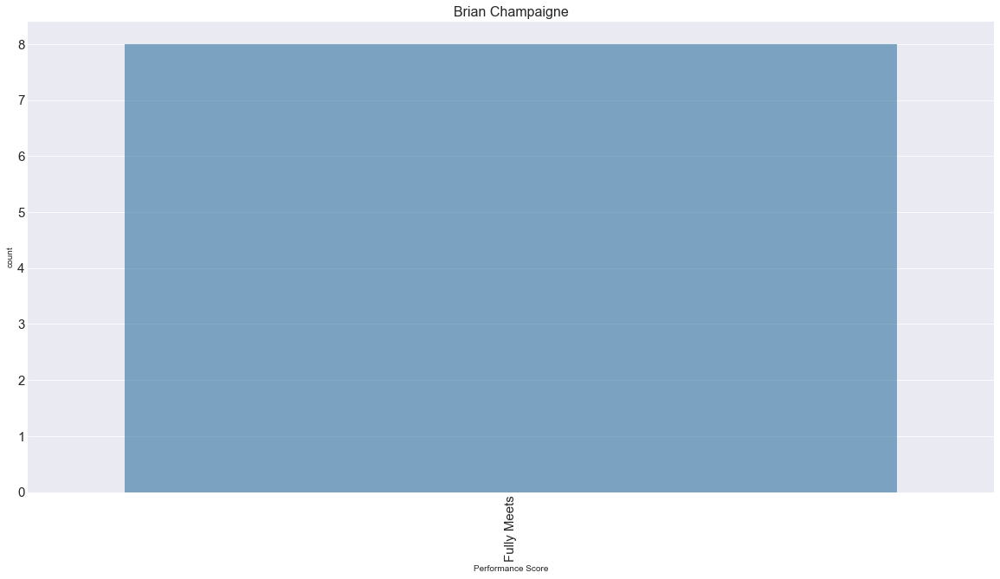

In [558]:

plt.figure(figsize=(20, 10))
plt.tick_params(labelsize=15)
plt.title("Brian Champaigne", fontsize=16)
plt.xticks(rotation='vertical')

sns.barplot(y=Champaigne['count'], x=Champaigne['Performance Score'], alpha=0.6, orient='v')
plt.show()

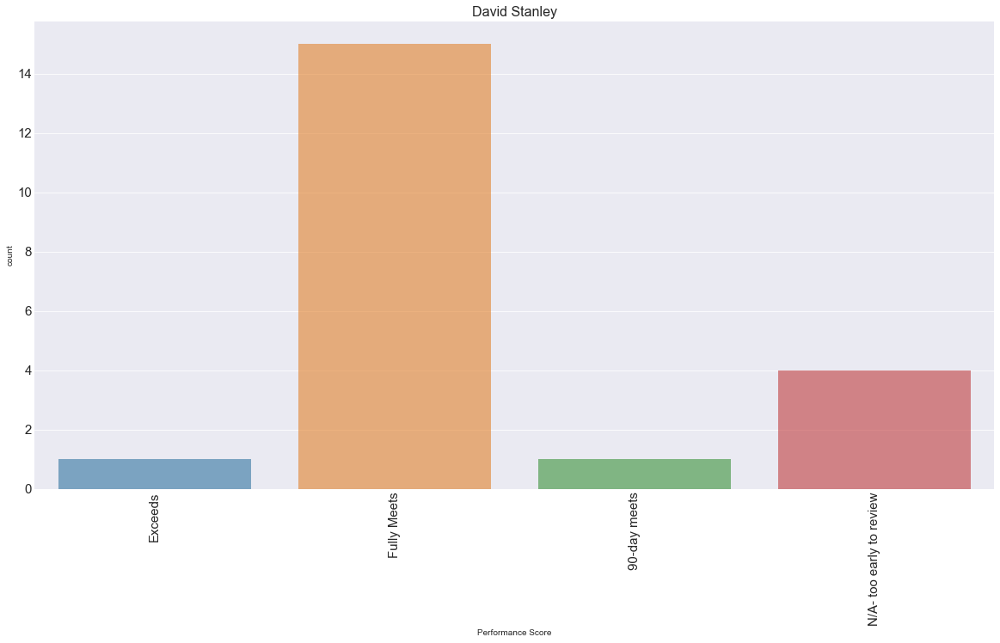

In [559]:

plt.figure(figsize=(20, 10))
plt.tick_params(labelsize=15)
plt.title("David Stanley", fontsize=16)
plt.xticks(rotation='vertical')

sns.barplot(y=Stanley['count'], x=Stanley['Performance Score'], alpha=0.6, orient='v')
plt.show()

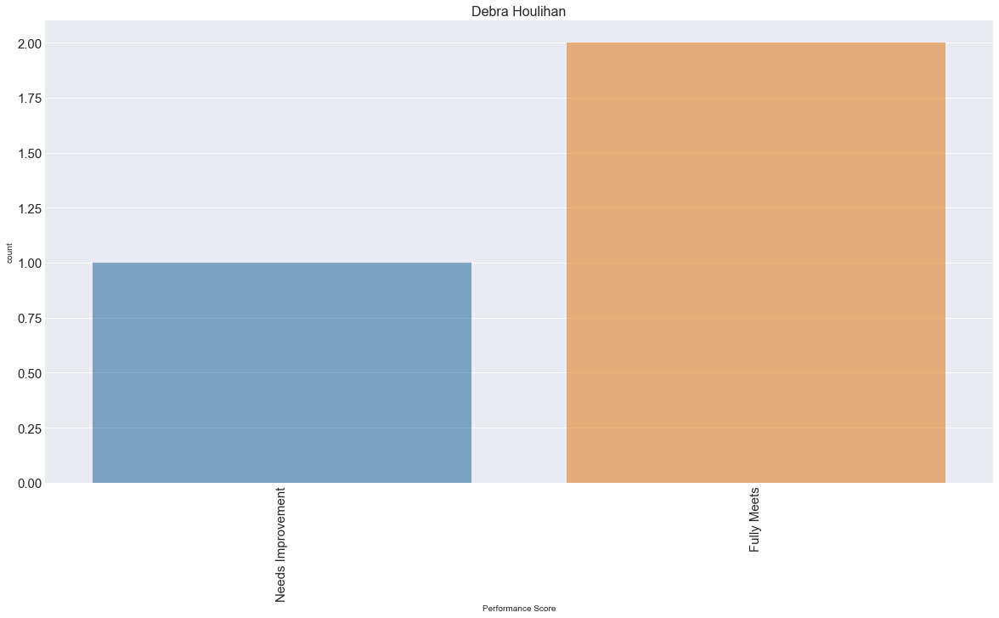

In [560]:

plt.figure(figsize=(20, 10))
plt.tick_params(labelsize=15)
plt.title("Debra Houlihan", fontsize=16)
plt.xticks(rotation='vertical')

sns.barplot(y=Houlihan['count'], x=Houlihan['Performance Score'], alpha=0.6, orient='v')
plt.show()

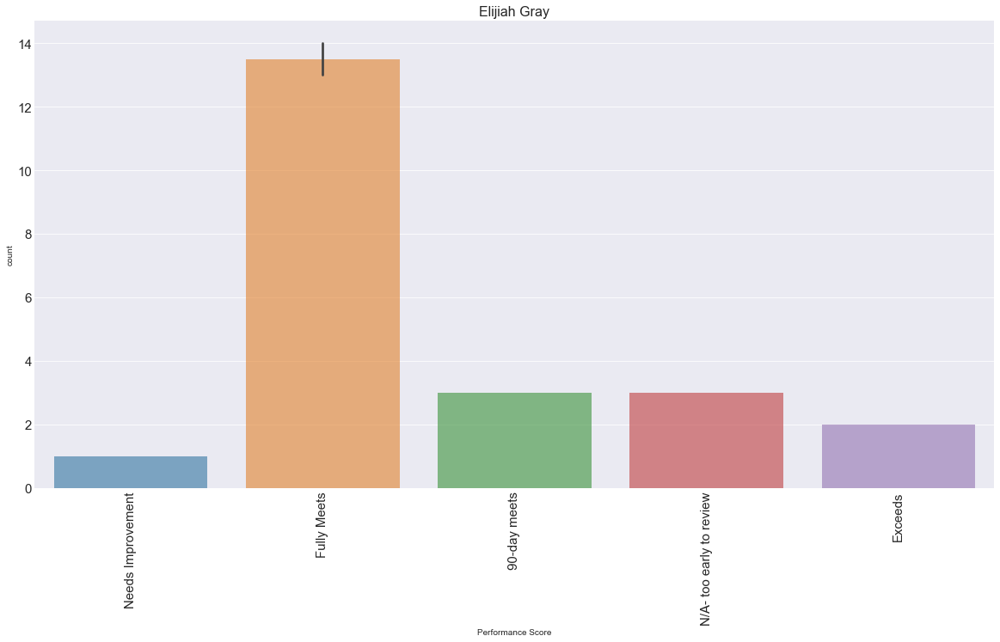

In [561]:

plt.figure(figsize=(20, 10))
plt.tick_params(labelsize=15)
plt.title("Elijiah Gray", fontsize=16)
plt.xticks(rotation='vertical')

sns.barplot(y=Gray['count'], x=Gray['Performance Score'], alpha=0.6, orient='v')
plt.show()

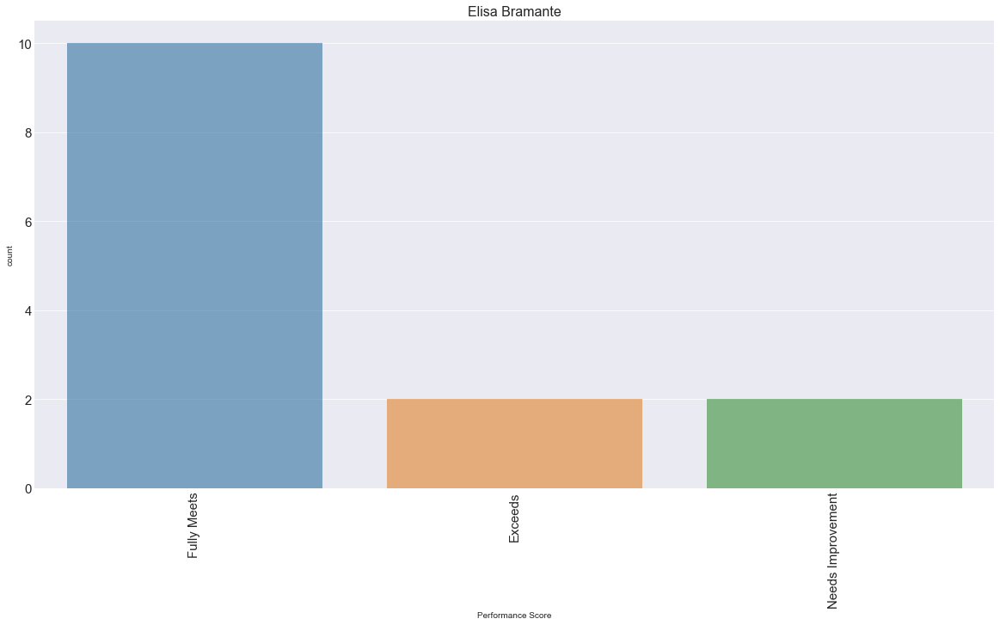

In [562]:

plt.figure(figsize=(20, 10))
plt.tick_params(labelsize=15)
plt.title("Elisa Bramante", fontsize=16)
plt.xticks(rotation='vertical')

sns.barplot(y=Bramante['count'], x=Bramante['Performance Score'], alpha=0.6, orient='v')
plt.show()

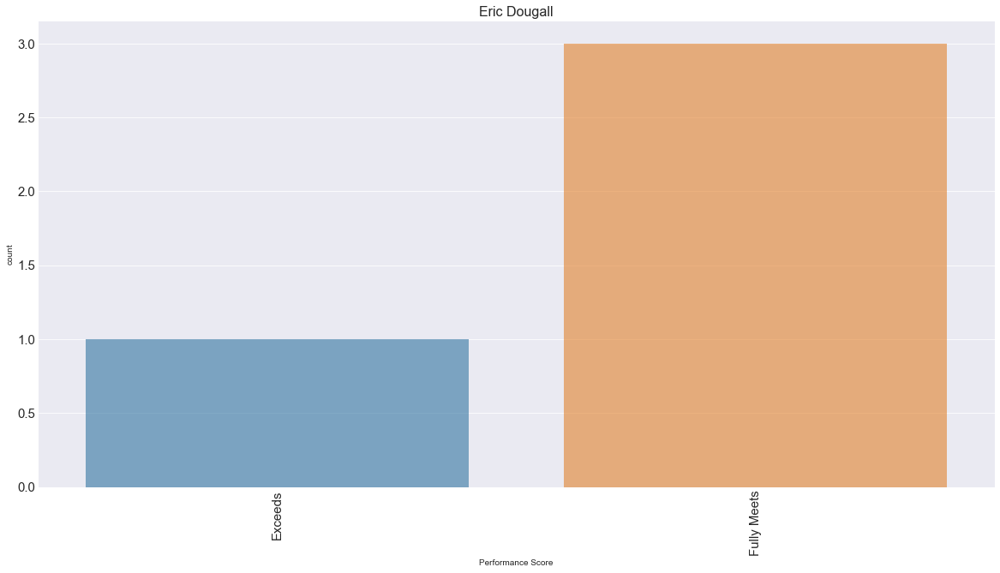

In [563]:

plt.figure(figsize=(20, 10))
plt.tick_params(labelsize=15)
plt.title("Eric Dougall", fontsize=16)
plt.xticks(rotation='vertical')

sns.barplot(y=Dougall['count'], x=Dougall['Performance Score'], alpha=0.6, orient='v')
plt.show()

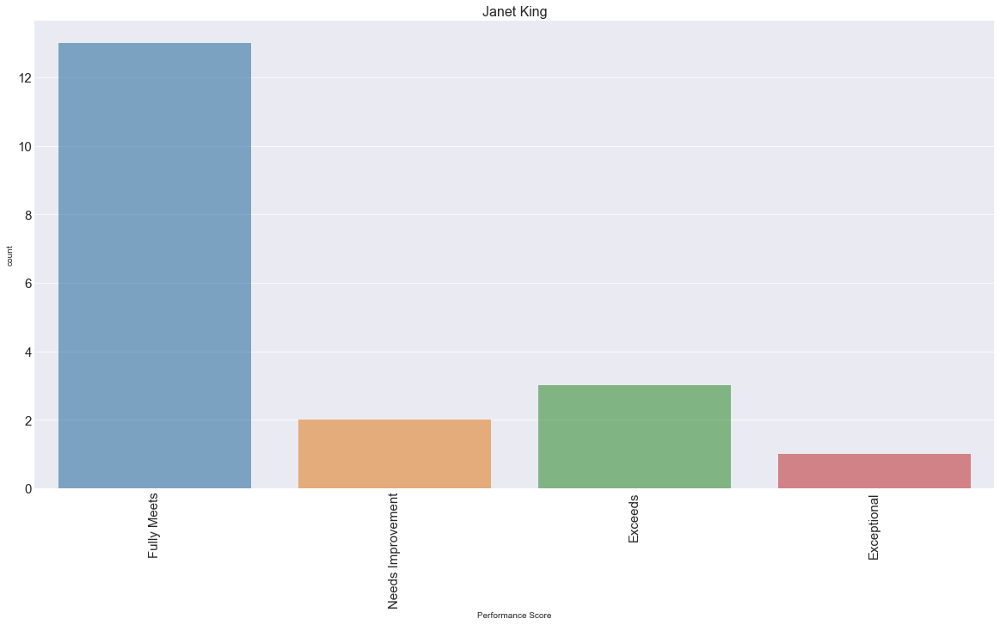

In [564]:

plt.figure(figsize=(20, 10))
plt.tick_params(labelsize=15)
plt.title("Janet King", fontsize=16)
plt.xticks(rotation='vertical')

sns.barplot(y=King['count'], x=King['Performance Score'], alpha=0.6, orient='v')
plt.show()

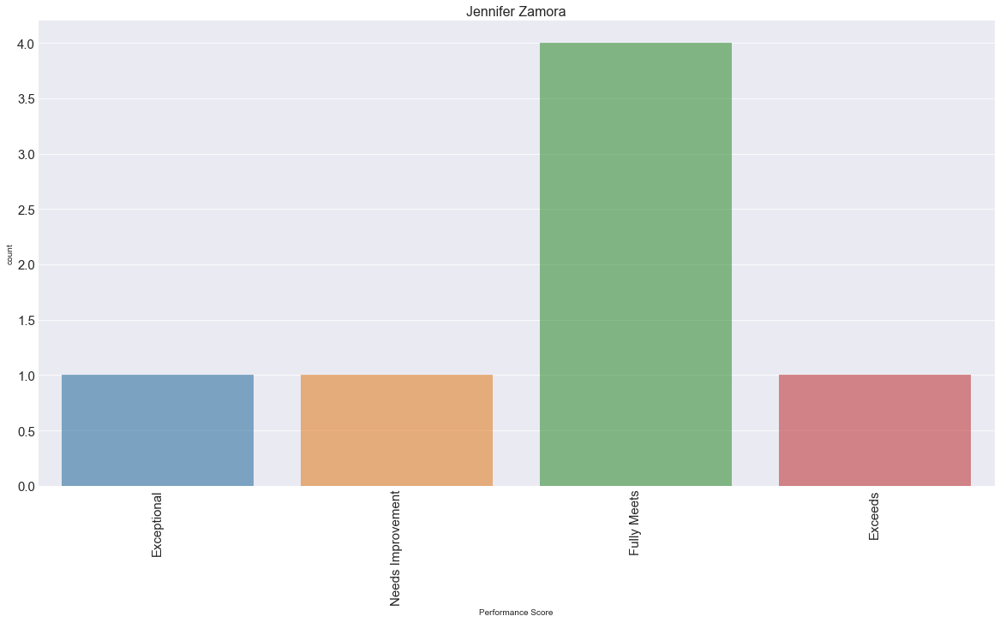

In [565]:

plt.figure(figsize=(20, 10))
plt.tick_params(labelsize=15)
plt.title("Jennifer Zamora", fontsize=16)
plt.xticks(rotation='vertical')

sns.barplot(y=Zamora['count'], x=Zamora['Performance Score'], alpha=0.6, orient='v')
plt.show()

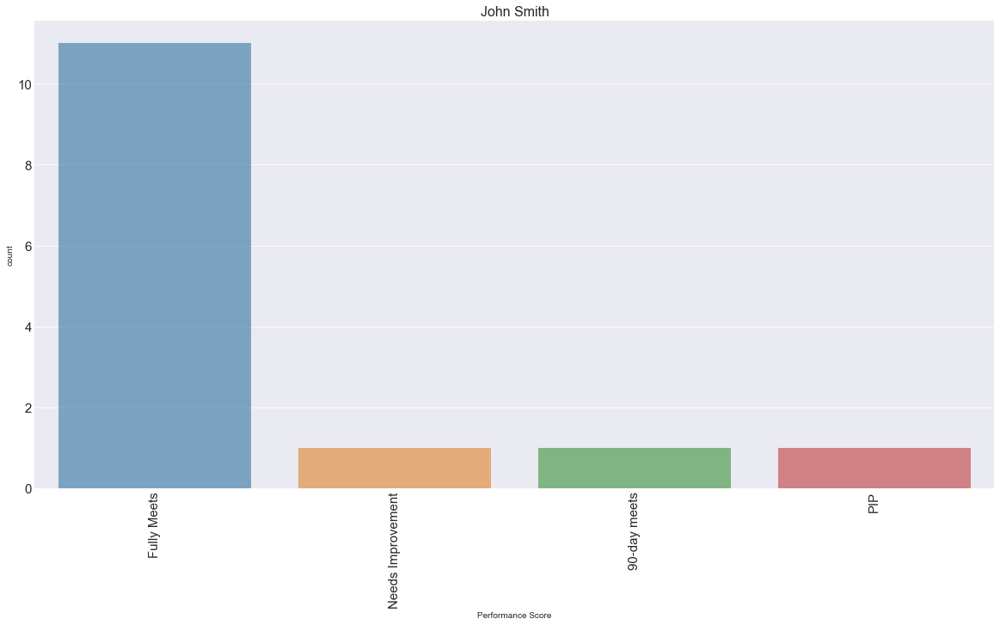

In [567]:

plt.figure(figsize=(20, 10))
plt.tick_params(labelsize=15)
plt.title("John Smith", fontsize=16)
plt.xticks(rotation='vertical')

sns.barplot(y=Smith['count'], x=Smith['Performance Score'], alpha=0.6, orient='v')
plt.show()

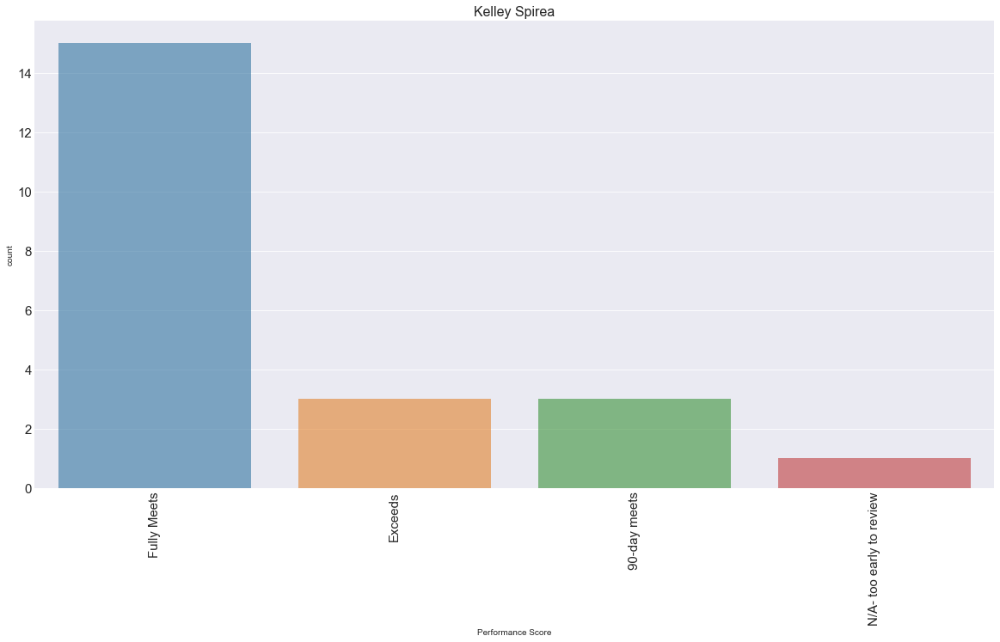

In [568]:

plt.figure(figsize=(20, 10))
plt.tick_params(labelsize=15)
plt.title("Kelley Spirea", fontsize=16)
plt.xticks(rotation='vertical')

sns.barplot(y=Spirea['count'], x=Spirea['Performance Score'], alpha=0.6, orient='v')
plt.show()

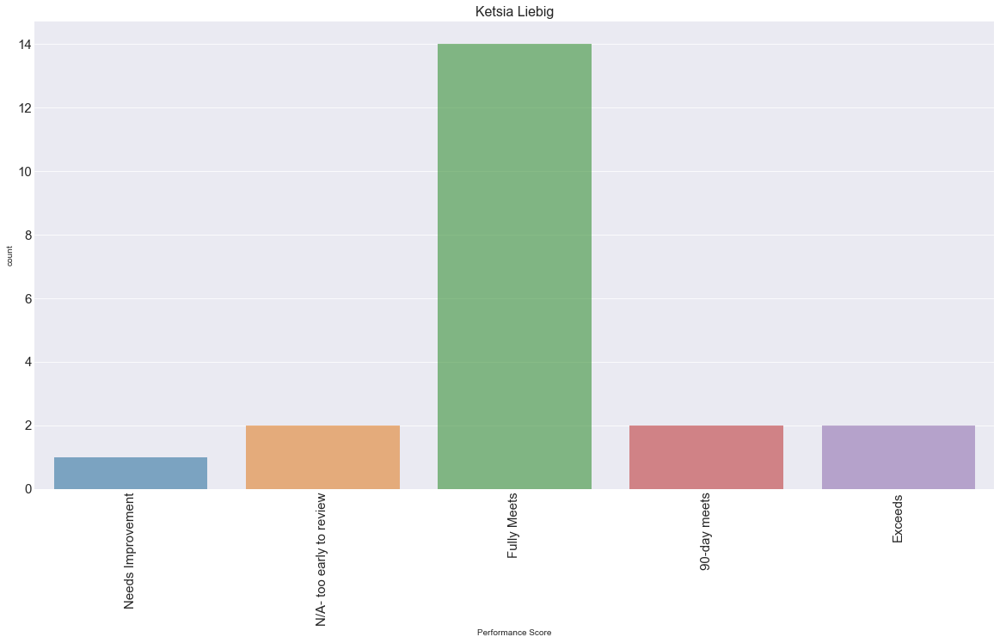

In [569]:

plt.figure(figsize=(20, 10))
plt.tick_params(labelsize=15)
plt.title("Ketsia Liebig", fontsize=16)
plt.xticks(rotation='vertical')

sns.barplot(y=Liebig['count'], x=Liebig['Performance Score'], alpha=0.6, orient='v')
plt.show()

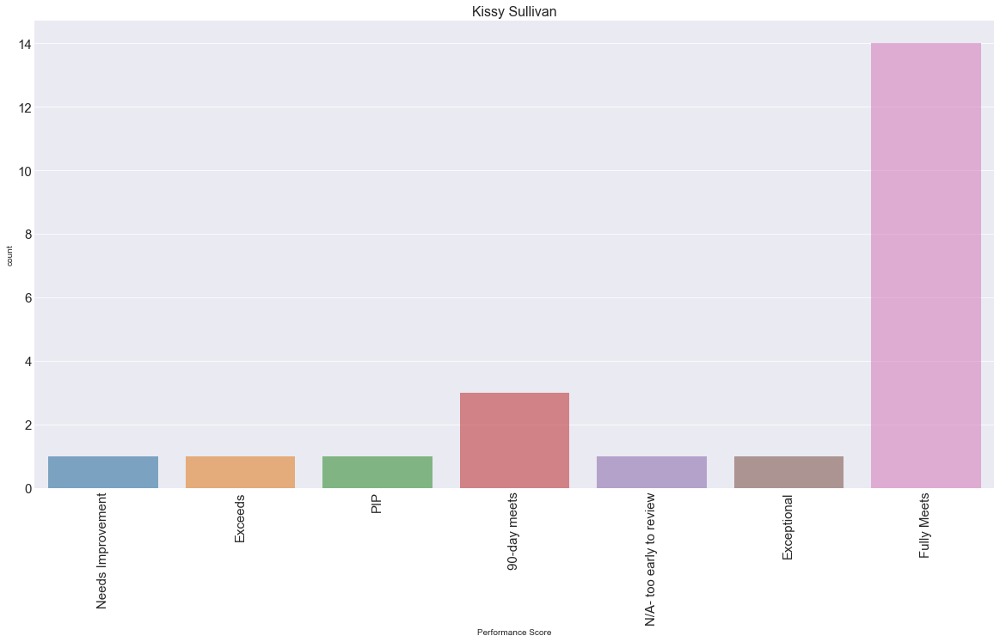

In [571]:

plt.figure(figsize=(20, 10))
plt.tick_params(labelsize=15)
plt.title("Kissy Sullivan", fontsize=16)
plt.xticks(rotation='vertical')

sns.barplot(y=Sullivan['count'], x=Sullivan['Performance Score'], alpha=0.6, orient='v')
plt.show()

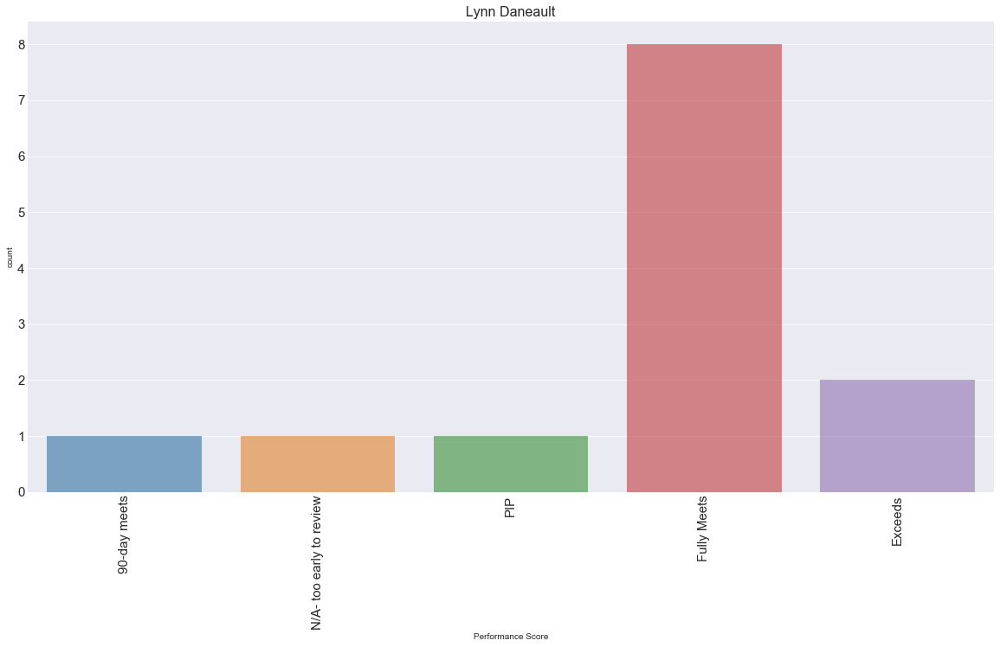

In [572]:

plt.figure(figsize=(20, 10))
plt.tick_params(labelsize=15)
plt.title("Lynn Daneault", fontsize=16)
plt.xticks(rotation='vertical')

sns.barplot(y=Daneault['count'], x=Daneault['Performance Score'], alpha=0.6, orient='v')
plt.show()

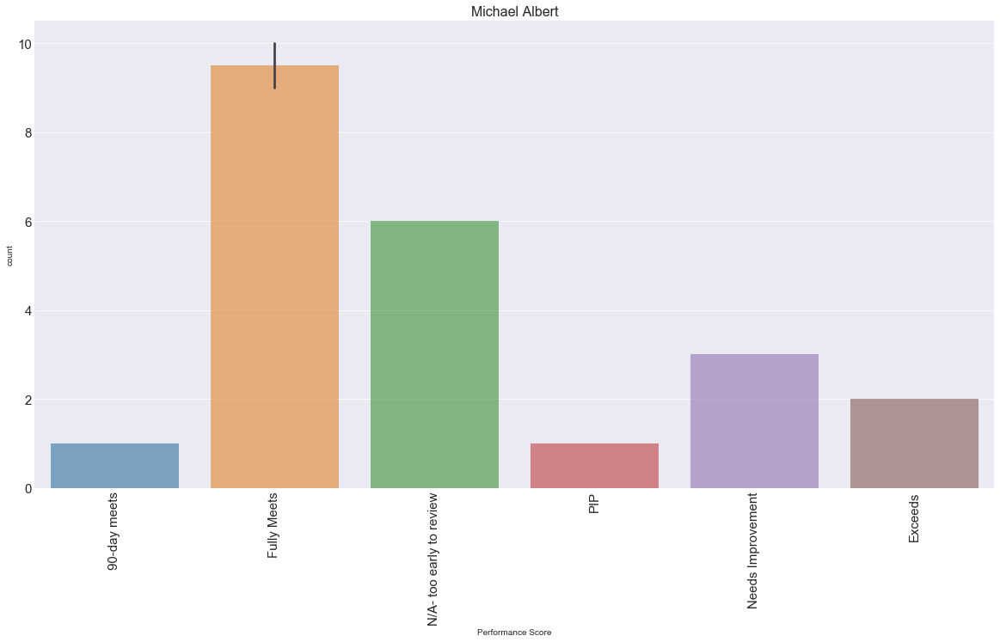

In [573]:

plt.figure(figsize=(20, 10))
plt.tick_params(labelsize=15)
plt.title("Michael Albert", fontsize=16)
plt.xticks(rotation='vertical')

sns.barplot(y=Albert['count'], x=Albert['Performance Score'], alpha=0.6, orient='v')
plt.show()

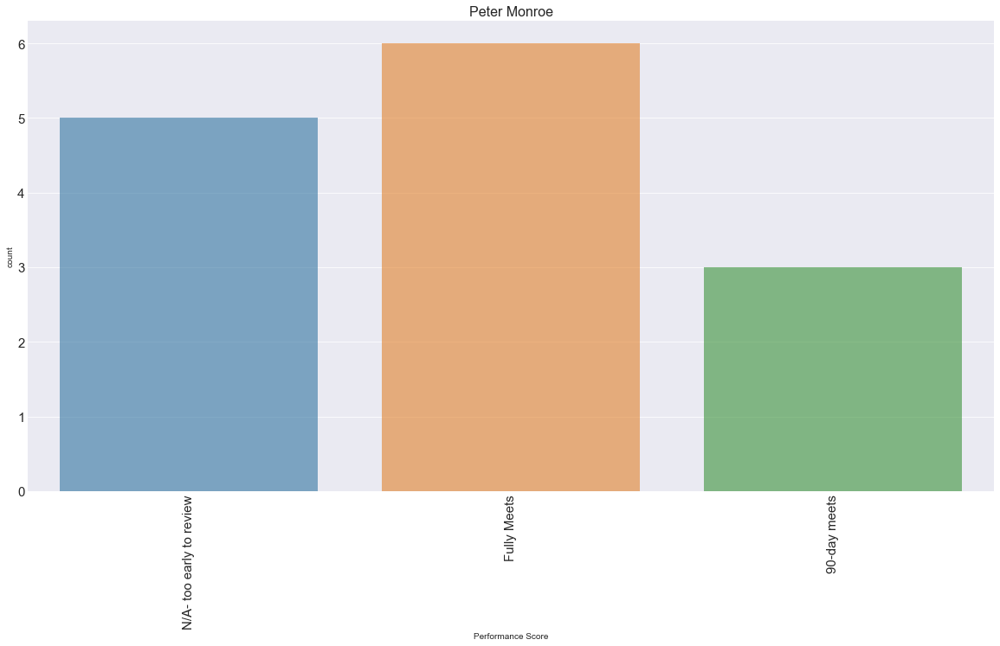

In [574]:

plt.figure(figsize=(20, 10))
plt.tick_params(labelsize=15)
plt.title("Peter Monroe", fontsize=16)
plt.xticks(rotation='vertical')

sns.barplot(y=Monroe['count'], x=Monroe['Performance Score'], alpha=0.6, orient='v')
plt.show()

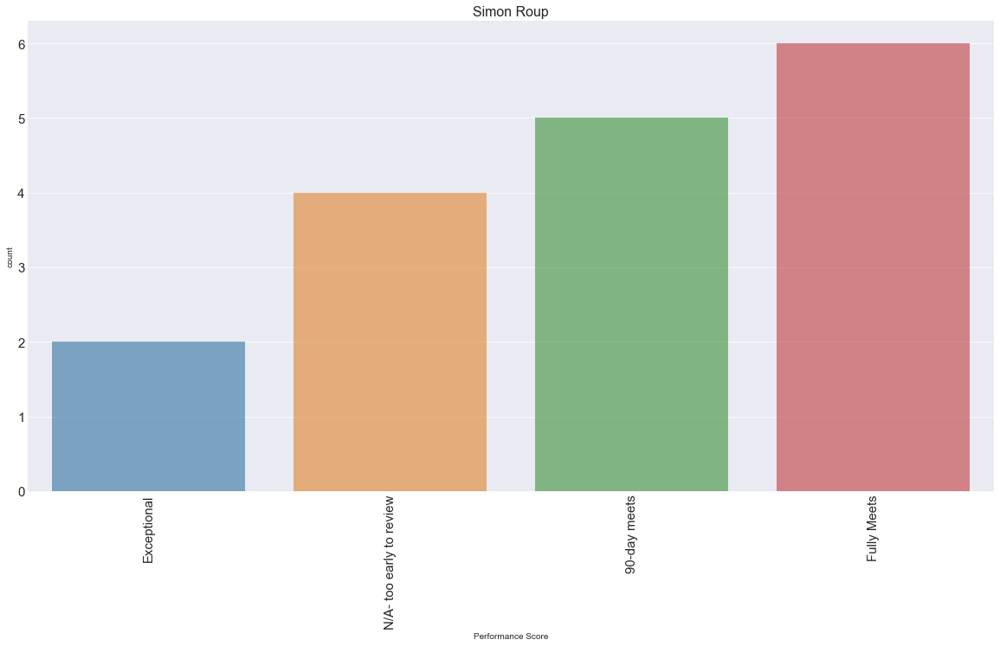

In [575]:

plt.figure(figsize=(20, 10))
plt.tick_params(labelsize=15)
plt.title("Simon Roup", fontsize=16)
plt.xticks(rotation='vertical')

sns.barplot(y=Roup['count'], x=Roup['Performance Score'], alpha=0.6, orient='v')
plt.show()

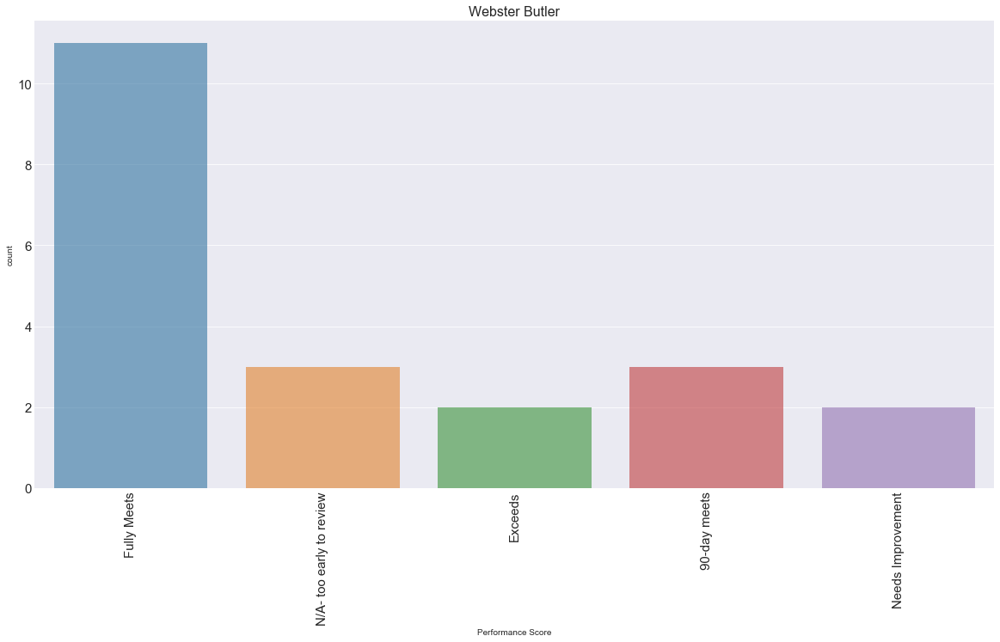

In [578]:

plt.figure(figsize=(20, 10))
plt.tick_params(labelsize=15)
plt.title("Webster Butler", fontsize=16)
plt.xticks(rotation='vertical')

sns.barplot(y=Butler['count'], x=Butler['Performance Score'], alpha=0.6, orient='v')
plt.show()

In [35]:

pg_connection = {
    'host': 'dsstudents.skillbox.ru',
    'port': 5432,
    'dbname': 'human_resources',
    'user': 'readonly',
    'password': '6hajV34RTQfmxhS'
}
conn = psycopg2.connect(**pg_connection)


cursor = conn.cursor()


sql_str = "SELECT COLUMN_NAME FROM INFORMATION_SCHEMA.columns where TABLE_NAME = 'hr_dataset';"


cursor.execute(sql_str)
#считиваем заголовки таблицы
for row in cursor:
    print(row)
    
conn.close()

('id',)
('Employee Name',)
('Employee Number',)
('marriedid',)
('maritalstatusid',)
('genderid',)
('empstatus_id',)
('deptid',)
('perf_scoreid',)
('age',)
('Pay Rate',)
('state',)
('zip',)
('dob',)
('sex',)
('maritaldesc',)
('citizendesc',)
('Hispanic/Latino',)
('racedesc',)
('Date of Hire',)
('Days Employed',)
('Date of Termination',)
('Reason For Term',)
('Employment Status',)
('department',)
('position',)
('Manager Name',)
('Employee Source',)
('Performance Score',)


In [34]:
pg_connection = {
    'host': 'dsstudents.skillbox.ru',
    'port': 5432,
    'dbname': 'human_resources',
    'user': 'readonly',
    'password': '6hajV34RTQfmxhS'
}
conn = psycopg2.connect(**pg_connection)

    
cursor = conn.cursor()


sql_str = "SELECT COLUMN_NAME FROM INFORMATION_SCHEMA.columns where TABLE_NAME = 'production_staff';"

#считиваем заголовки таблицы
cursor.execute(sql_str)

for row in cursor:
    print(row)
    
conn.close()

('id',)
('Employee Name',)
('Race Desc',)
('Date of Hire',)
('TermDate',)
('Reason for Term',)
('Employment Status',)
('Department',)
('Position',)
('Pay',)
('Manager Name',)
('Performance Score',)
('Abutments/Hour Wk 1',)
('Abutments/Hour Wk 2',)
('Daily Error Rate',)
('90-day Complaints',)


In [184]:
pg_connection = {
    'host': 'dsstudents.skillbox.ru',
    'port': 5432,
    'dbname': 'human_resources',
    'user': 'readonly',
    'password': '6hajV34RTQfmxhS'
}


conn = psycopg2.connect(**pg_connection)
cursor = conn.cursor()


sql_str = '(SELECT marriedid, MAX("Days Employed"), AVG("Days Employed"), MIN("Days Employed") \
from hr_dataset GROUP BY marriedid);'

married = pd.read_sql_query(sql_str, conn )
    
conn.close()
married

,marriedid,max,avg,min
0,0,4339,1328.866310,2
1,1,3611,1246.235772,2


In [186]:
pg_connection = {
    'host': 'dsstudents.skillbox.ru',
    'port': 5432,
    'dbname': 'human_resources',
    'user': 'readonly',
    'password': '6hajV34RTQfmxhS'
}
conn = psycopg2.connect(**pg_connection)

conn = psycopg2.connect(**pg_connection)
cursor = conn.cursor()


sql_str = 'SELECT age, MAX("Days Employed"), AVG("Days Employed"), MIN("Days Employed") from hr_dataset \
group by age order by age;'


age = pd.read_sql_query(sql_str, conn )
    
conn.close()
age


,age,max,avg,min
0,25,2211,1843.500000,1476
1,26,905,849.500000,794
2,27,2428,1547.000000,439
3,28,2092,962.583333,57
4,29,3611,1626.466667,8
5,30,3317,1093.533333,127
6,31,2336,1200.080000,6
7,32,2645,1309.416667,58
8,33,1954,1059.235294,19
9,34,2386,1098.105263,124


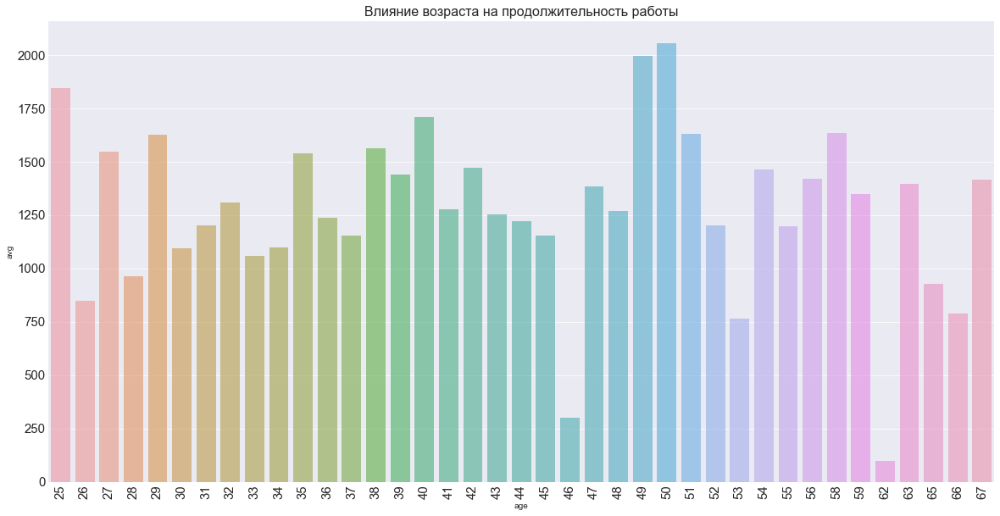

In [281]:

plt.figure(figsize=(20, 10))
plt.tick_params(labelsize=15)
plt.title("Влияние возраста на продолжительность работы", fontsize=16)
plt.xticks(rotation='vertical')

sns.barplot(y=age['avg'], x=age['age'], alpha=0.6, orient='v')
plt.show()

In [127]:
pg_connection = {
    'host': 'dsstudents.skillbox.ru',
    'port': 5432,
    'dbname': 'human_resources',
    'user': 'readonly',
    'password': '6hajV34RTQfmxhS'
}


conn = psycopg2.connect(**pg_connection)
cursor = conn.cursor()


sql_str = '(SELECT "Employee Name", "position", "Employment Status", "department" FROM  hr_dataset) UNION \
(SELECT "Employee Name", "Position", "Department", "Employment Status" FROM  production_staff)\
    ORDER BY "department";'




name_emp = pd.read_sql_query(sql_str, conn )
    
conn.close()
name_emp

,Employee Name,position,Employment Status,department
0,"Sullivan, Kissy",Production Manager,Production,Active
1,"Gonzalez, Cayo",Production Technician I,Production,Active
2,"Medeiros, Jennifer",Production Technician I,Production,Active
3,"Osturnka, Adeel",Production Technician I,Production,Active
4,"Motlagh, Dawn",Production Technician I,Production,Active
...,...,...,...,...
515,"Oliver, Brooke",Production Technician II,Production,Voluntarily Terminated
516,"Leach, Dallas",Production Technician I,Production,Voluntarily Terminated
517,"Roberson, May",Production Technician II,Production,Voluntarily Terminated
518,"Barton, Nader",Production Technician I,Production,Voluntarily Terminated


In [195]:
pg_connection = {
    'host': 'dsstudents.skillbox.ru',
    'port': 5432,
    'dbname': 'human_resources',
    'user': 'readonly',
    'password': '6hajV34RTQfmxhS'
}


conn = psycopg2.connect(**pg_connection)
cursor = conn.cursor()


sql_str = ' \
SELECT "Pay", "Performance Score" FROM  production_staff \
WHERE "Performance Score" IS  NOT NULL ORDER BY "Pay";'


#таблица по зарплате и оценке производительности работников производства

name_emp1 = pd.read_sql_query(sql_str, conn )
    
conn.close()
name_emp1

,Pay,Performance Score
0,$14.00,Fully Meets
1,$14.00,Fully Meets
2,$14.00,Fully Meets
3,$14.00,Fully Meets
4,$14.00,Fully Meets
...,...,...
204,$54.00,Fully Meets
205,$54.50,Fully Meets
206,$55.00,Fully Meets
207,$55.00,Exceeds


In [259]:
pg_connection = {
    'host': 'dsstudents.skillbox.ru',
    'port': 5432,
    'dbname': 'human_resources',
    'user': 'readonly',
    'password': '6hajV34RTQfmxhS'
}


conn = psycopg2.connect(**pg_connection)
cursor = conn.cursor()


sql_str = '\
SELECT "Pay Rate", "Days Employed", "Performance Score" FROM  hr_dataset WHERE "Days Employed" is not null \
   order by  "Pay Rate";'

#таблица по зарплате, кол-во отработанных дней и оценке производительности hr 



name_emp2 = pd.read_sql_query(sql_str, conn )
    
conn.close()
name_emp2

,Pay Rate,Days Employed,Performance Score
0,14.0,1318,Fully Meets
1,14.0,1378,Fully Meets
2,14.0,2022,Fully Meets
3,14.0,1055,Fully Meets
4,14.0,2512,Fully Meets
...,...,...,...
305,63.5,446,Fully Meets
306,64.0,1421,Exceeds
307,65.0,2787,Exceptional
308,65.0,2417,Exceptional


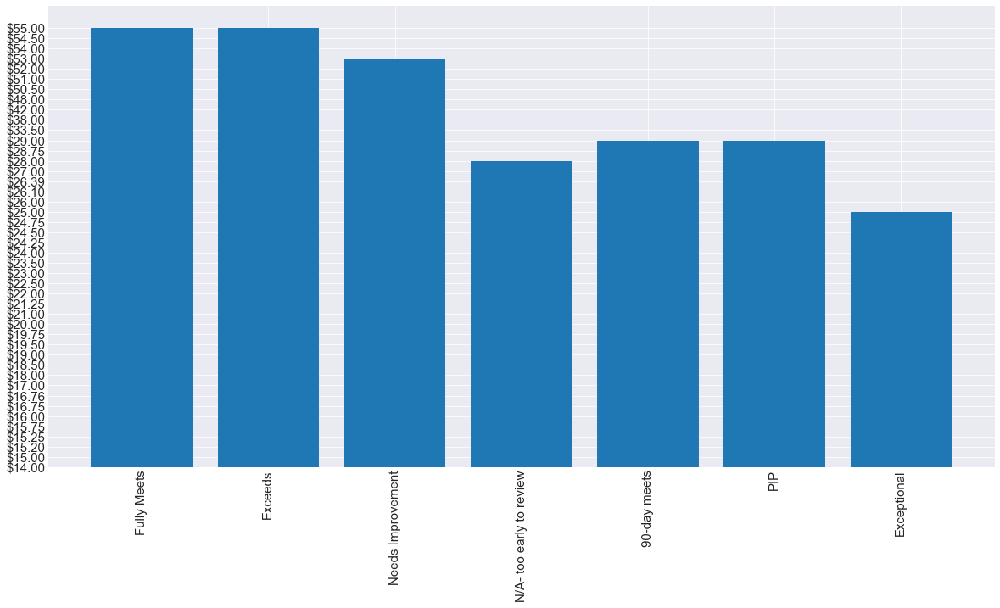

In [258]:
fig, subplot = plt.subplots(figsize=(20, 10))

plt.xticks(rotation='vertical')

plt.tick_params(labelsize=15)

subplot.bar(name_emp1['Performance Score'], name_emp1['Pay'])

plt.show()


#соотношение оплаты и оценки производительности


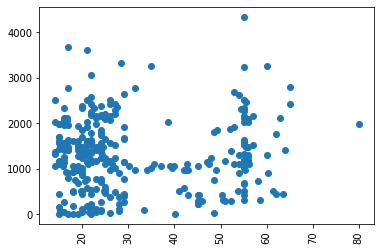

In [212]:
#соотношение зарплаты и кол-во рабочих дней

fig, subplot = plt.subplots()


plt.xticks(rotation='vertical')
subplot.scatter(x=['Pay Rate'], 
                y=name_emp2['Days Employed'])


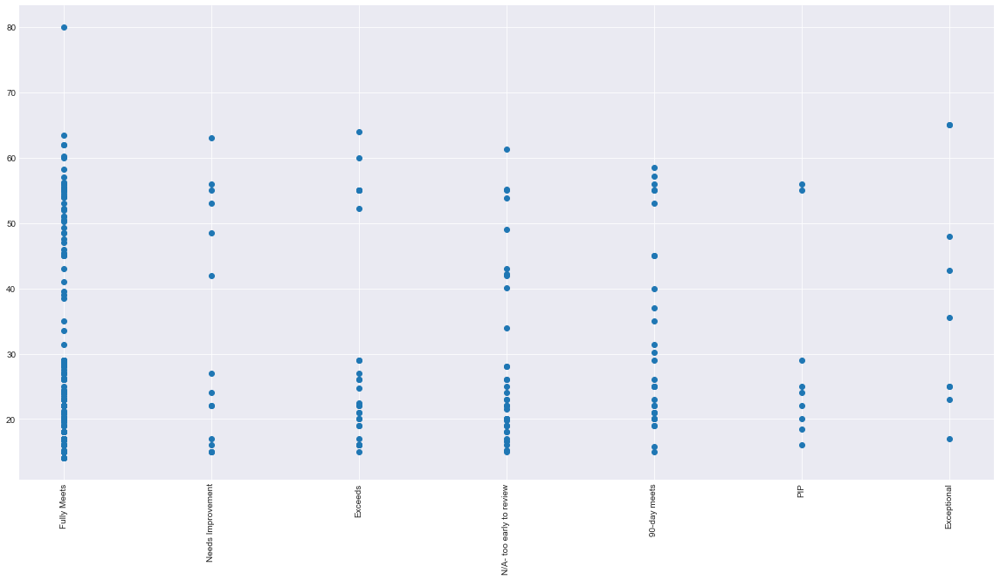

In [262]:
#отношение зарплаты и оценки производительности
fig, subplot = plt.subplots(figsize=(20, 10))


plt.xticks(rotation='vertical')
subplot.scatter(x=name_emp2['Performance Score'], 
                y=name_emp2['Pay Rate'])


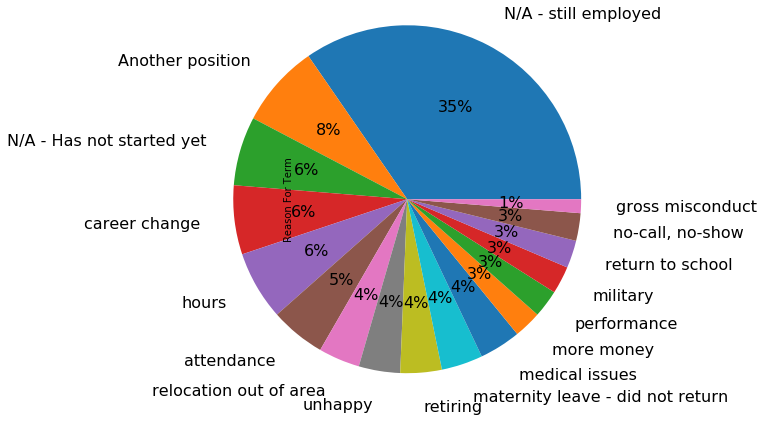

In [227]:
#соотношение причин ухода
borrowers = depart_term['Reason For Term'].value_counts()

plot = borrowers.plot.pie(fontsize=16, autopct='%1.0f%%', labeldistance=1.2, radius=2)

In [189]:
pg_connection = {
    'host': 'dsstudents.skillbox.ru',
    'port': 5432,
    'dbname': 'human_resources',
    'user': 'readonly',
    'password': '6hajV34RTQfmxhS'
}


conn = psycopg2.connect(**pg_connection)
cursor = conn.cursor()


sql_str = '(SELECT  "department", "position", "Reason For Term" FROM  hr_dataset WHERE "department" IS  NOT NULL ) \
UNION \
(SELECT "Department", "Position", "Reason for Term" FROM  production_staff WHERE "Department" IS  NOT NULL ) \
    ;'

#Перечислить сотрудников по департаментам, позиции и статусу занятости
depart_term = pd.read_sql_query(sql_str, conn )
    
conn.close()
depart_term

,department,position,Reason For Term
0,Sales,Area Sales Manager,N/A - still employed
1,Production,Production Technician II,Another position
2,Admin Offices,Administrative Assistant,N/A - still employed
3,Software Engineering,Software Engineer,medical issues
4,Production,Production Technician I,more money
...,...,...,...
73,Admin Offices,Sr. Accountant,N/A - still employed
74,Production,Production Technician I,military
75,IT/IS,Sr. DBA,hours
76,IT/IS,Sr. Network Engineer,N/A - Has not started yet


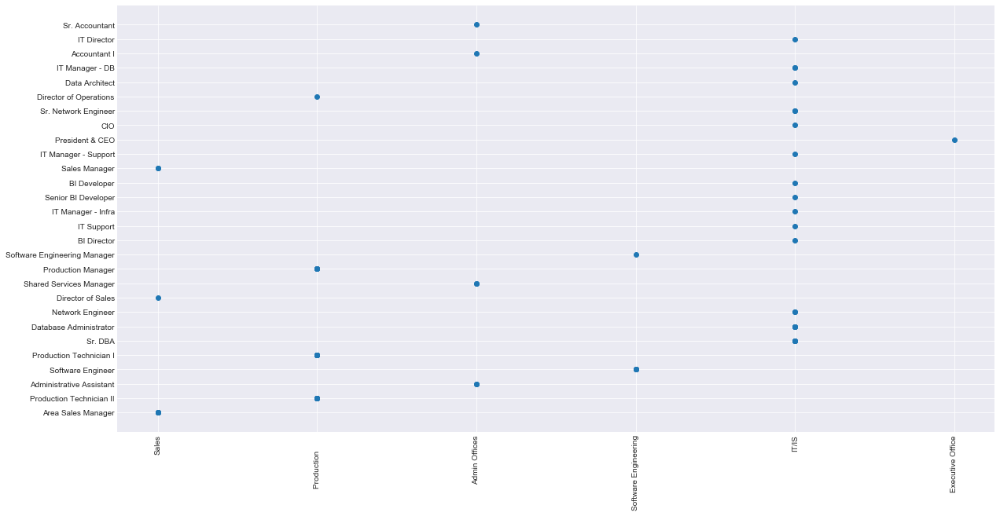

In [263]:
#разброс позиций по департаментам
fig, subplot = plt.subplots(figsize=(20, 10))


plt.xticks(rotation='vertical')
subplot.scatter(x=depart_term['department'], 
                y=depart_term['position'])


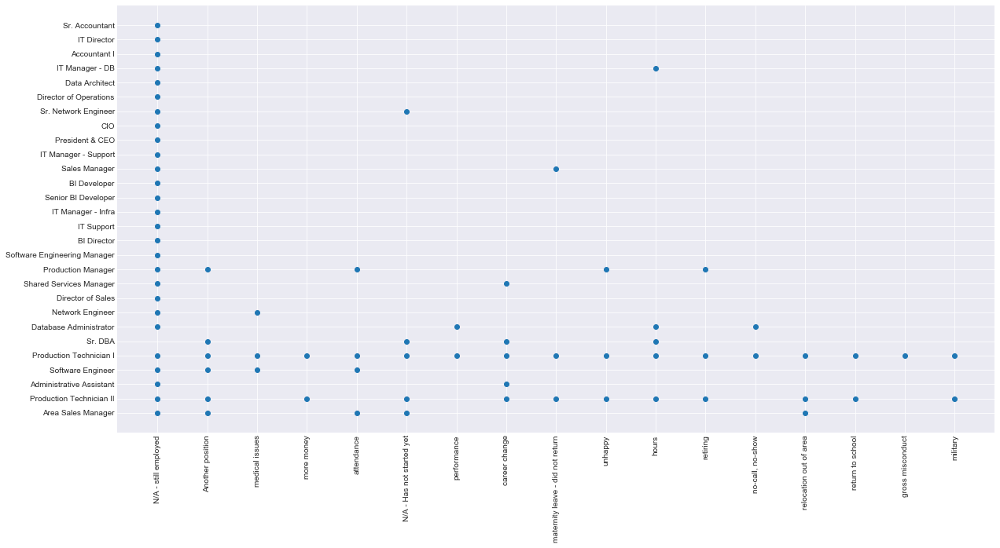

In [282]:
#разброс позиций и причин ухода
fig, subplot = plt.subplots(figsize=(20, 10))


plt.xticks(rotation='vertical')
subplot.scatter(x=depart_term['Reason For Term'], 
                y=depart_term['position'])


> Есть зависимость между `perfomance score` и тем, под чьим руководством работает сотрудник

* У меньшего кол-ва менеджеров есть работники  с оценкой `план на повышение производительности`, у всех менеджеров есть работники с оценкой `полностью соответствует`

* Большее кол-во оценки полностью соответствует у  `David Stanley, Kelley Spirea, меньшее - Board of Directors`

* Большее кол-во оценки нужны улучшения `Michael Albert`
 
* Большее кол-во оценки превосходно `Brannon Miller`

* Большее кол-во оценки план на повышение производительности ``Brannon Miller``

> Есть зависимость между продолжительностью работы в компании и семейным положением сотрудника.

* Женатые в среднем прорабатывают меньше дней, чем холостые. У холостых большее максимальное кол-во рабочих дней

> Есть зависимость между продолжительностью работы в компании и возрастом сотрудника.

* Работники `старше 35 и моложе 45` в среднем имеют большее кол-во рабочих дней

* Пики кол-во рабочих дней (свыше 1500 дней) приходят на `25, 27, 29, 35, 38,40, 49, 50, 51, 58`

> Есть зависимость между заработной платой  и продолжительностью работы сотрудника

* Большее кол-во работников получают `до 30 $`  и имеют от 10 до 2000 рабочих дней

* Большое кол-во людей имеет зарплату `55 $` и кол-во рабочих дней от 10 до  2500

> Есть зависимость между производительностью и заработной платой сотрудника

* Высшая точка заработной платы у оценки производительности полностью соответствует(`55 $`), меньшая точка у оценки   неожиданно(`25 $`)

* При оценке полностью соответствует основные показатели заработной платы `от 5 до 30 $ и от 45 до 58 $`

* У тех, кто проходит испытательный срок в основном зарплата `до 30 $`

* При оценке нужны улучшения в основном зарплата `до 30 $ и от 42 $`

* При оценке превосходно в основном зарплата `до 30 $`

* При оценке план на повышение в основном зарплата `до 30 $`

* При оценке неожиданно разброс зарплаты `от 15 до 65 $`

> Есть зависимоть между позицией сотрудника и причиной ухода

* Самая популярная причина ухода `другая позиция`, наименее популярная `грубый проступок`

* Большее число уходов с менее ведущих позиций (популярна причина `смена профессии`)

* Наибольшее разнообразие причин ухода у `технологов`

* В отделе `IT` наибольшее разнообразие позиций, наименьшее в `исполнительном отделе`

# Вторая часть 
## анализ группы skillbox



In [394]:

access_token = '0656a860aac47902233c31343eb7c5b1958039f345bc433015e17cf35bdc2e8e1456e44b4a2d5dec8b12c'
owner_id = '-66669811'
#указываем токен и id администратора
import requests
import time 
import datetime
import csv
import re
import seaborn as sns
plt.style.use('seaborn-darkgrid')
palette = plt.get_cmap('Set2')
import pandas  as pd

#имопртируем модули
def getjson(url, data = None):
    response = requests.get(url, params = data)
   
    return response.json()
#создаем ф-ю которая извлекает данные по ссылке и пакует их в json

def get_all_posts (access_token, owner_id, count = 100, offset=0):
    all_posts = []
     
    while True:
        time.sleep(1)#сон в 1 секунду
        wall = getjson("https://api.vk.com/method/wall.get", { #делаем запрос к api vk wall.get методу, указываем параметры для него
            'owner_id' : owner_id, 
            'count' : count,
            'access_token' : access_token,
            'offset' : offset,
            'v' : '5.92'
            })
         
        count_posts = wall['response']['count'] #узнаем кол-во постов
        posts = wall['response']['items'] #узнаем номер постов
         
        all_posts.extend(posts) #добавляем пост 
         
        if len(all_posts) >= count_posts: #если кол-во постов листе не больше кол-во постов в запросе
            break
        else:
            offset += 100              #смещаем еще на 100
    return all_posts, count_posts
 
def make_posts(all_posts):
    filtered_data = []
    for post in all_posts:
         
        try:
            id = post['id']
        except:                       #ловим ошибки,если данные есть, то указываем их в переменной, если нет ставим отсутствие
            id = 0
             
        try:
            owner_id = str(post['owner_id'])[1:] #с 1 чтобы не читался минус
        except:
            owner_id = ''
              
        try:
            link = 'https://vk.com/wall-{owner_id}_{id}'.format(owner_id = owner_id, id = id) #адрес ссылки
        except:
            link = ''
             
        try:
            date = datetime.datetime.fromtimestamp(int(post['date'])).strftime('%d-%m-%Y')#превращаем в дату (число,месяц,год)
        except:
            date = ''
         
        try:
            day = datetime.datetime.fromtimestamp(int(post['date'])).strftime('%d')#в день
        except:
            day = ''
        try:
            month = datetime.datetime.fromtimestamp(int(post['date'])).strftime('%B')#в месяц
        except:
            month = ''
             
        try:
            year = datetime.datetime.fromtimestamp(int(post['date'])).strftime('%Y')#в год
        except:
            year = ''
 
        try:
            weekday = datetime.datetime.fromtimestamp(int(post['date'])).strftime('%A')#в день недели
        except:
            weekday = ''
 
        try:
            time = datetime.datetime.fromtimestamp(int(post['date'])).strftime('%H')#в часы
        except:
            time = ''
             
             
        try:
            likes = post['likes']['count'] # кол-во лайков
        except:
            likes = 0
             
        try:
            reposts = post['reposts']['count'] # кол-во репостов
        except:
            reposts = 0
             
        try:
            comments = post['comments']['count']#кол-во комментов
        except:
            comments = 0
             
        try:
            views = post['views']['count'] #кол-во просмотров
        except:
            views = 0
             
        try:
            text = post['text']
            
            if text:
                tags = re.findall(r'#\w+', str(text)) #проверям если в тексте тег с помощью регулрного выражения
                if tags:
                    tags = ', '.join(tags) #превращаем теши в строку из листа
                else:
                    tags = ''
    
        except:
            text = ''
         
        photos = []
        videos = []
        docs = []
         
        try:
            attachments = post['attachments'] # есть ли прикрепленное
             
            if attachments:
                 
                for att in attachments:
                    if att['type'] == 'video':
                        video_title = att['video']['title']
                        video_owner_id = str(att['video']['owner_id'])[1:] #если есть видео добавлем название, id, ссылку
                        video_id = att['video']['id']
                        video_url ='https://vk.com/video-{}_{}'.format(video_owner_id, video_id)
                        videos.append({video_title : video_url})
 
                    if att['type'] == 'photo':
                        photo_id = att['photo']['id']
                        photo_owner_id = str(att['photo']['owner_id'])[1:]
                        photo_url = 'https://vk.com/photo-{}_{}'.format(photo_owner_id, photo_id)  #то же фото
                        photos.append(photo_url)
                         
                    if att['type'] == 'doc':
                        doc_url = att['doc']['url']
                        doc_title = att['doc']['title']  #то же документы
                        docs.append({doc_title : doc_url})
 
        except:
            attachments = ''
             
        if len(photos) == 0:
            photos = ''
        if len(videos) == 0:
            videos = ''
        if len(docs) == 0:
            docs = ''
             
        filtered_post = {
                'id' : id,
                'date' : date,
                'year' : year,
                'month' : month,
                'day' : day,
                'weekday' : weekday,      #словарь со значениями из поста
                'time' : time,

                'likes' : likes,
                'reposts' : reposts,
                'comments' : comments,
                'views' : views, 
                'text' : str(text),
                'tags': tags,
                'photos' : photos,
                'videos' : videos,
                'docs' : docs,
                'link' : link,
                'group_id' : owner_id,
                }
         
         
        filtered_data.append(filtered_post)
     
    return filtered_data
# фун-я где фильтруем данные по столбцам 
 
def write_csv(data, encoding = 'utf-8'):

    owner_id = data[0]['group_id']
    filename = '{owner_id}-{datetime}.csv'.format(owner_id = owner_id, datetime= str(datetime.datetime.now())[:10] )
    with open(filename, 'w', newline = '', encoding = encoding) as csvfile:
        fieldnames = ['id','date','year','month','day', 'weekday', 'time',
                      'likes', 'reposts', 'views', 'comments', 'text', 'tags', 
                      'photos', 'videos', 'docs', 'link']
         
        writer = csv.DictWriter(csvfile, delimiter = ';', fieldnames = fieldnames, extrasaction = 'ignore')
        writer.writeheader()
        writer.writerows(data)
         
        print ('Data written to csv', filename)
    csvfile.close
#фу-я которая записывает csv,указываем id группы, название из id и даты, записываем заголовки, записываем строки, печатаем название файла
#закрываем файл
all_posts, count_posts = get_all_posts (access_token, owner_id) #подключаемся и загружаем все посты и кол-во постов
 
pposts = make_posts(all_posts)#фильтруем посты
 
write_csv(pposts) #записываем файл из отфильтрованной информации

Data written to csv 66669811-2020-10-07.csv


In [395]:
skillbox_posts = pd.read_csv('66669811-2020-10-07.csv', sep=';', encoding='utf-8')


skillbox_posts.head(10) #делаем дф

,id,date,year,month,day,weekday,time,likes,reposts,views,comments,text,tags,photos,videos,docs,link
0,102938,06-10-2020,2020,October,6,Tuesday,18,26,4,9465,0,"Вас дёргают за ниточки, заставляют делать то, ...","#Статья_Skillbox, #Skillbox_управление",NaN,NaN,NaN,https://vk.com/wall-66669811_102938
1,102636,06-10-2020,2020,October,6,Tuesday,15,83,3,12765,10,#Instagram празднует свой десятый #Деньрождени...,"#Instagram, #Деньрождения, #Инстаграм, #В_закл...","['https://vk.com/photo-66669811_457507276', 'h...",NaN,NaN,https://vk.com/wall-66669811_102636
2,102623,06-10-2020,2020,October,6,Tuesday,13,23,1,10198,0,📌 8 октября приглашаем на открытую встречу о ...,#Skillbox_Дизайн,['https://vk.com/photo-66669811_457507275'],NaN,NaN,https://vk.com/wall-66669811_102623
3,102387,05-10-2020,2020,October,5,Monday,16,51,2,16414,2,"Талантливые, креативные, терпеливые и мудрые! ...",#День_учителя,"['https://vk.com/photo-66669811_457507236', 'h...",NaN,NaN,https://vk.com/wall-66669811_102387
4,102209,05-10-2020,2020,October,5,Monday,14,31,3,14001,2,Ловите расписание вебинаров! На этой неделе по...,#Расписание_Skillbox,"['https://vk.com/photo-66669811_457507220', 'h...",NaN,NaN,https://vk.com/wall-66669811_102209
5,101934,04-10-2020,2020,October,4,Sunday,13,115,2,24231,10,В Японии завершился конкурс дизайна упаковки J...,"#Упаковка_Skillbox, #Skillbox_дизайн","['https://vk.com/photo-66669811_457507156', 'h...",NaN,NaN,https://vk.com/wall-66669811_101934
6,101810,03-10-2020,2020,October,3,Saturday,17,58,7,21914,5,"Начинающий программист: «Выучу только Python, ...","#Совет_препода_Skillbox, #Skillbox_программиро...","['https://vk.com/photo-66669811_457507124', 'h...",NaN,NaN,https://vk.com/wall-66669811_101810
7,101638,02-10-2020,2020,October,2,Friday,17,236,42,27006,7,Выполнить рутинную работу в пару кликов?\n\nВп...,"#Skillbox_управление, #В_закладки_Skillbox","['https://vk.com/photo-66669811_457507094', 'h...",NaN,NaN,https://vk.com/wall-66669811_101638
8,101161,01-10-2020,2020,October,1,Thursday,19,61,7,17561,8,"«Леттеринг» — это рисование букв. Объясняем, ...","#Статья_Skillbox, #Skillbox_дизайн",NaN,NaN,NaN,https://vk.com/wall-66669811_101161
9,101146,01-10-2020,2020,October,1,Thursday,15,28,0,17962,20,Начинаем октябрь в онлайн-лектории Skillbox с ...,#Лекторий_Skillbox,['https://vk.com/photo-66669811_457507054'],NaN,NaN,https://vk.com/wall-66669811_101146


In [514]:
skillbox_posts_2020 = skillbox_posts[skillbox_posts['year']==2020].copy()

skillbox_posts_2019 = skillbox_posts[skillbox_posts['year']==2019].copy()

skillbox_posts_2018 = skillbox_posts[skillbox_posts['year']==2018].copy()

skillbox_posts_2017 = skillbox_posts[skillbox_posts['year']==2017].copy()
#делаем д/фы по годам

In [535]:
skillbox_posts_2020_like = skillbox_posts_2020.groupby('tags').agg({'likes': sum})

skillbox_posts_2020_like = skillbox_posts_2020_like[skillbox_posts_2020_like['likes']> 100]


skillbox_posts_2020_reposts = skillbox_posts_2020.groupby('tags').agg({'reposts': sum})

skillbox_posts_2020_reposts = skillbox_posts_2020_reposts[skillbox_posts_2020_reposts['reposts']> 50]


skillbox_posts_2020_comments = skillbox_posts_2020.groupby('tags').agg({'comments': sum})

skillbox_posts_2020_comments = skillbox_posts_2020_comments[skillbox_posts_2020_comments['comments']> 50]

skillbox_posts_2020_views = skillbox_posts_2020.groupby('tags').agg({'views': sum})

skillbox_posts_2020_views = skillbox_posts_2020_views[skillbox_posts_2020_views['views']> 100000]
#делаем дф по тегам по 2020 по значимым значениям по репостам, лайкам, комментарям, просмотрам

In [400]:
plt.figure(figsize=(210, 100))#создаём график 
plt.tick_params(labelsize=200)
plt.title("Кол-во лайков по тегам", fontsize=200)
plt.xticks(rotation='vertical')

sns.barplot(x=skillbox_posts_2020_like.index, y=skillbox_posts_2020_like['likes'], alpha=0.6, orient='v')
plt.show()

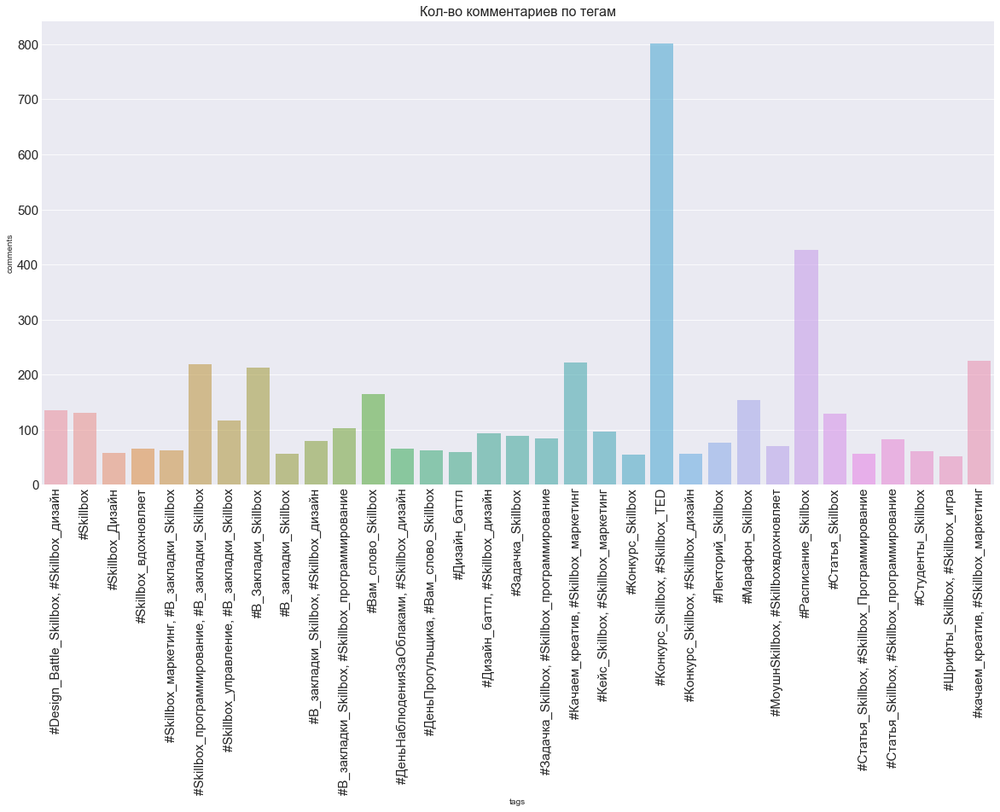

In [402]:


plt.figure(figsize=(20, 10))
plt.tick_params(labelsize=15)
plt.title("Кол-во комментариев по тегам", fontsize=16)
plt.xticks(rotation='vertical')

sns.barplot(y=skillbox_posts_2020_comments['comments'], x=skillbox_posts_2020_comments.index, alpha=0.6, orient='v')
plt.show()

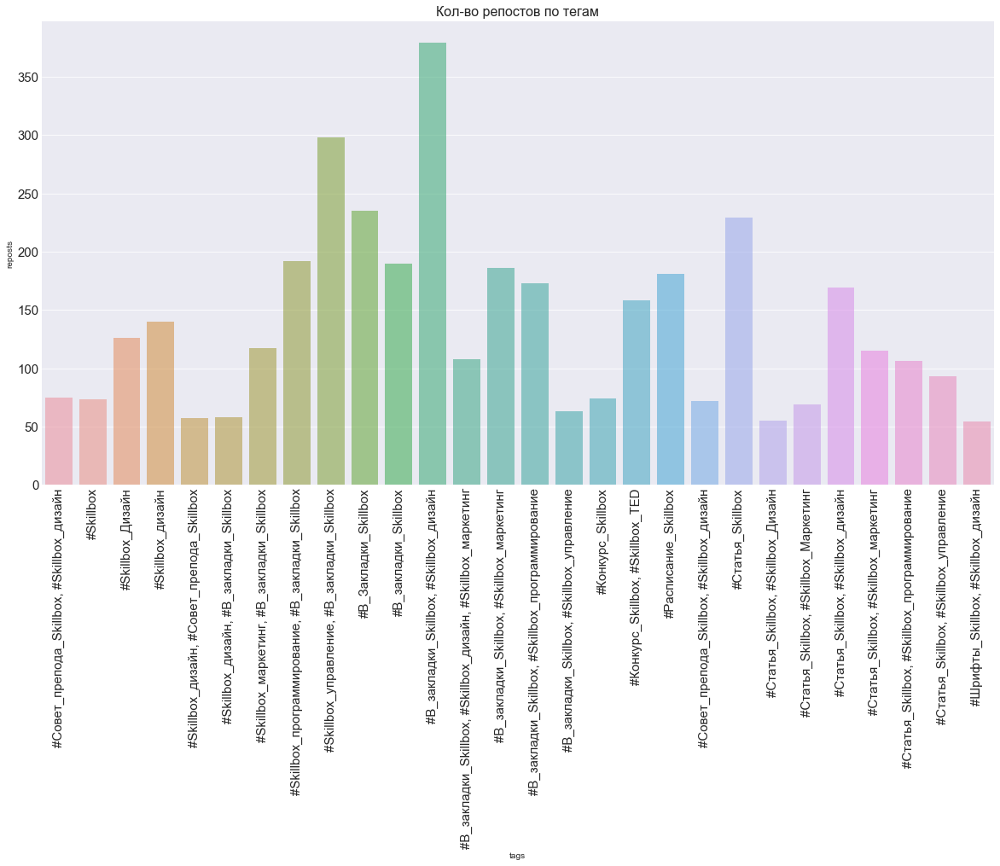

In [526]:

plt.figure(figsize=(20, 10))
plt.tick_params(labelsize=15)
plt.title("Кол-во репостов по тегам", fontsize=16)
plt.xticks(rotation='vertical')

sns.barplot(y=skillbox_posts_2020_reposts['reposts'], x=skillbox_posts_2020_reposts.index, alpha=0.6, orient='v')
plt.show()

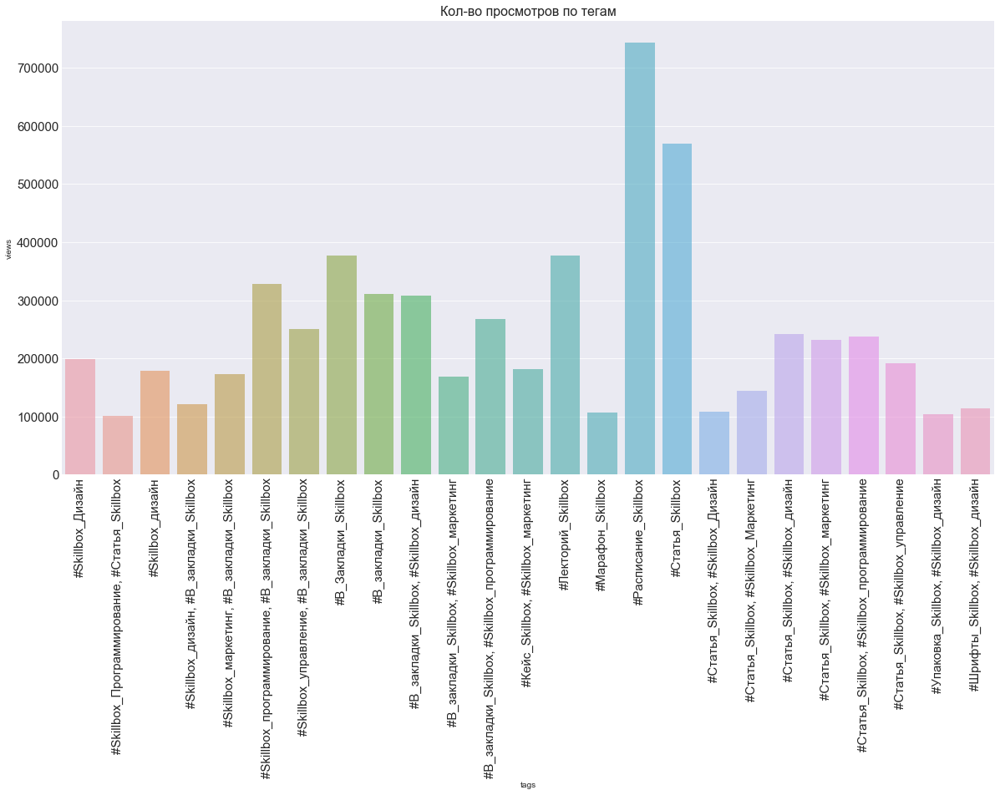

In [536]:


plt.figure(figsize=(20, 10))
plt.tick_params(labelsize=15)
plt.title("Кол-во просмотров по тегам", fontsize=16)
plt.xticks(rotation='vertical')

sns.barplot(y=skillbox_posts_2020_views['views'], x=skillbox_posts_2020_views.index, alpha=0.6, orient='v')
plt.show()

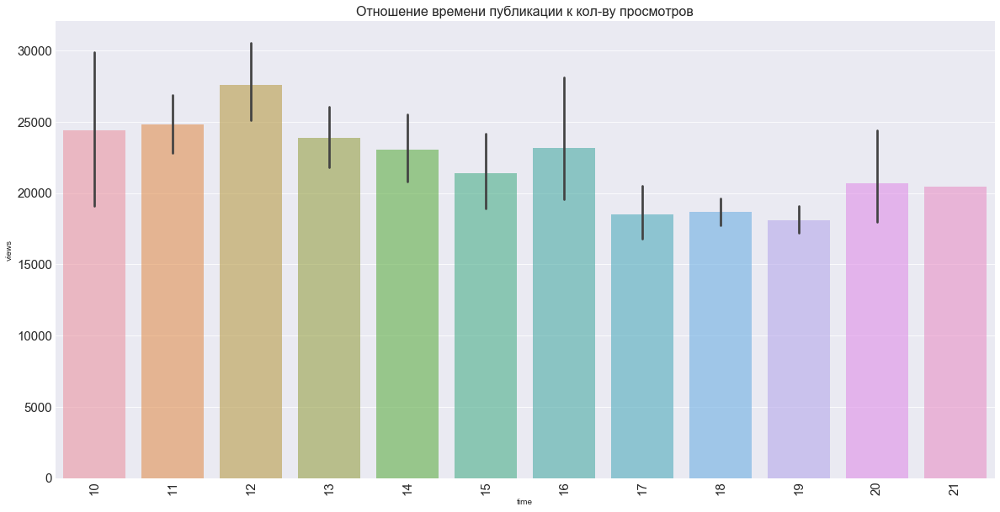

In [403]:

plt.figure(figsize=(20, 10))
plt.tick_params(labelsize=15)
plt.title("Отношение времени публикации к кол-ву просмотров", fontsize=16)
plt.xticks(rotation='vertical')

sns.barplot(y=skillbox_posts_2020['views'], x=skillbox_posts_2020['time'], alpha=0.6, orient='v')
plt.show()

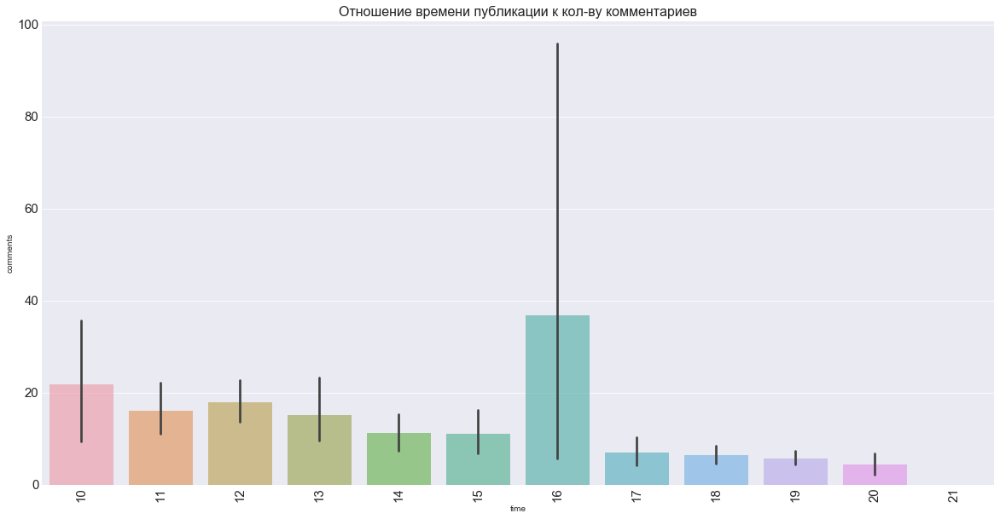

In [515]:

plt.figure(figsize=(20, 10))
plt.tick_params(labelsize=15)
plt.title("Отношение времени публикации к кол-ву комментариев", fontsize=16)
plt.xticks(rotation='vertical')

sns.barplot(y=skillbox_posts_2020['comments'], x=skillbox_posts_2020['time'], alpha=0.6, orient='v')
plt.show()

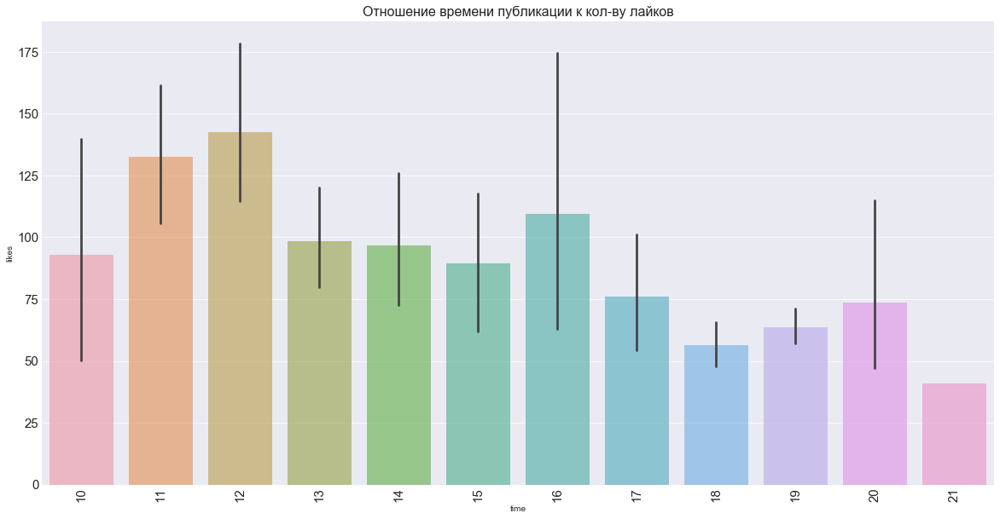

In [527]:

plt.figure(figsize=(20, 10))
plt.tick_params(labelsize=15)
plt.title("Отношение времени публикации к кол-ву лайков", fontsize=16)
plt.xticks(rotation='vertical')

sns.barplot(y=skillbox_posts_2020['likes'], x=skillbox_posts_2020['time'], alpha=0.6, orient='v')
plt.show()

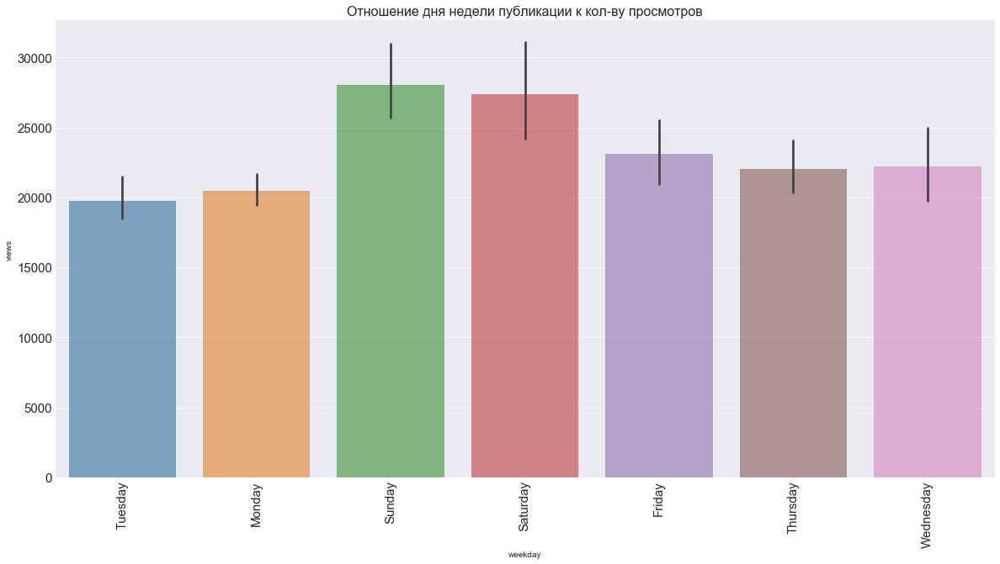

In [516]:

plt.figure(figsize=(20, 10))
plt.tick_params(labelsize=15)
plt.title("Отношение дня недели публикации к кол-ву просмотров", fontsize=16)
plt.xticks(rotation='vertical')

sns.barplot(y=skillbox_posts_2020['views'], x=skillbox_posts_2020['weekday'], alpha=0.6, orient='v')
plt.show()

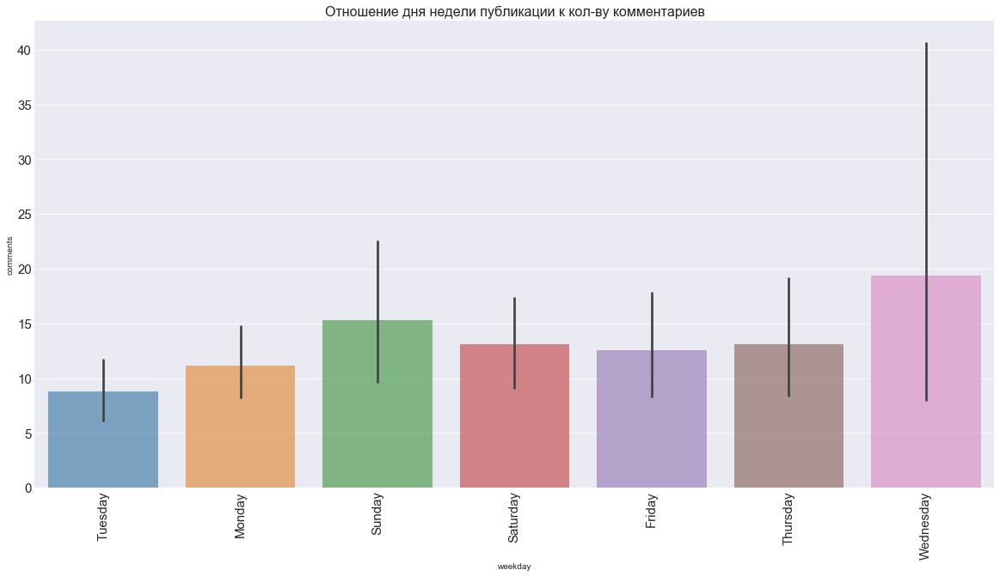

In [517]:

plt.figure(figsize=(20, 10))
plt.tick_params(labelsize=15)
plt.title("Отношение дня недели публикации к кол-ву комментариев", fontsize=16)
plt.xticks(rotation='vertical')

sns.barplot(y=skillbox_posts_2020['comments'], x=skillbox_posts_2020['weekday'], alpha=0.6, orient='v')
plt.show()

In [490]:
skillbox_posts_tags  = skillbox_posts_2020[:].dropna(subset=['tags'])
#дф без пропусков тегов

In [491]:
#дф по видам постов с помощью регулярных выражений фильтруем по вхождению
articles = skillbox_posts_tags[skillbox_posts_tags['tags'].str.contains('#Статья_Skillbox')]

inspiration = skillbox_posts_tags[skillbox_posts_tags['tags'].str.contains('#Skillbox_вдохновляет')]

teacher = skillbox_posts_tags[skillbox_posts_tags['tags'].str.contains('#Совет_препода_Skillbox')]

case = skillbox_posts_tags[skillbox_posts_tags['tags'].str.contains('#Кейс_Skillbox')]

timetable = skillbox_posts_tags[skillbox_posts_tags['tags'].str.contains('#Расписание_Skillbox')]
                                                                    
students = skillbox_posts_tags[skillbox_posts_tags['tags'].str.contains('#Студенты_Skillbox')]
                                                                    
marathon = skillbox_posts_tags[skillbox_posts_tags['tags'].str.contains('#Марафон_Skillbox')]
                                                                    
contests = skillbox_posts_tags[skillbox_posts_tags['tags'].str.contains('#Конкурс_Skillbox')]
                                                                    
news = skillbox_posts_tags[skillbox_posts_tags['tags'].str.contains('#Новости_Skillbox')]
                                                                    
task = skillbox_posts_tags[skillbox_posts_tags['tags'].str.contains('#Задачка_Skillbox')]
                                                                    
game = skillbox_posts_tags[skillbox_posts_tags['tags'].str.contains('#Игра_Skillbox')]
                                                                    
battle = skillbox_posts_tags[skillbox_posts_tags['tags'].str.contains('#Дизайн_баттл')]
                                                                    
discount = skillbox_posts_tags[skillbox_posts_tags['tags'].str.contains('#Скидки_Skillbox')]

bookmark = skillbox_posts_tags[skillbox_posts_tags['tags'].str.contains('#В_закладки_Skillbox')]      


In [492]:
#дф по направлениям постов с помощью регулярных выражений фильтруем по вхождению

design0 = skillbox_posts_tags[skillbox_posts_tags['tags'].str.contains('#Skillbox_дизайн')]
design1 = skillbox_posts_tags[skillbox_posts_tags['tags'].str.contains('#Skillbox_Дизайн')]
design = pd.concat([design0, design1])

programming0 = skillbox_posts_tags[skillbox_posts_tags['tags'].str.contains('#Skillbox_программирование')]
programming1 = skillbox_posts_tags[skillbox_posts_tags['tags'].str.contains( '#Skillbox_Программирование')]
programming = pd.concat([programming0, programming1])

marketing0 = skillbox_posts_tags[skillbox_posts_tags['tags'].str.contains('#Skillbox_маркетинг')]
marketing1 = skillbox_posts_tags[skillbox_posts_tags['tags'].str.contains('#Skillbox_Маркетинг')]
marketing = pd.concat([marketing0, marketing1])

management0 = skillbox_posts_tags[skillbox_posts_tags['tags'].str.contains( '#Skillbox_управление')]
management1 = skillbox_posts_tags[skillbox_posts_tags['tags'].str.contains( '#Skillbox_Управление')]
managemen = pd.concat([management0, management1])                                                                    

                                                                    


In [537]:
skillbox_posts_2020.head(1)

,id,date,year,month,day,weekday,time,likes,reposts,views,comments,text,tags,photos,videos,docs,link
0,102938,06-10-2020,2020,October,6,Tuesday,18,26,4,9465,0,"Вас дёргают за ниточки, заставляют делать то, ...","#Статья_Skillbox, #Skillbox_управление",NaN,NaN,NaN,https://vk.com/wall-66669811_102938


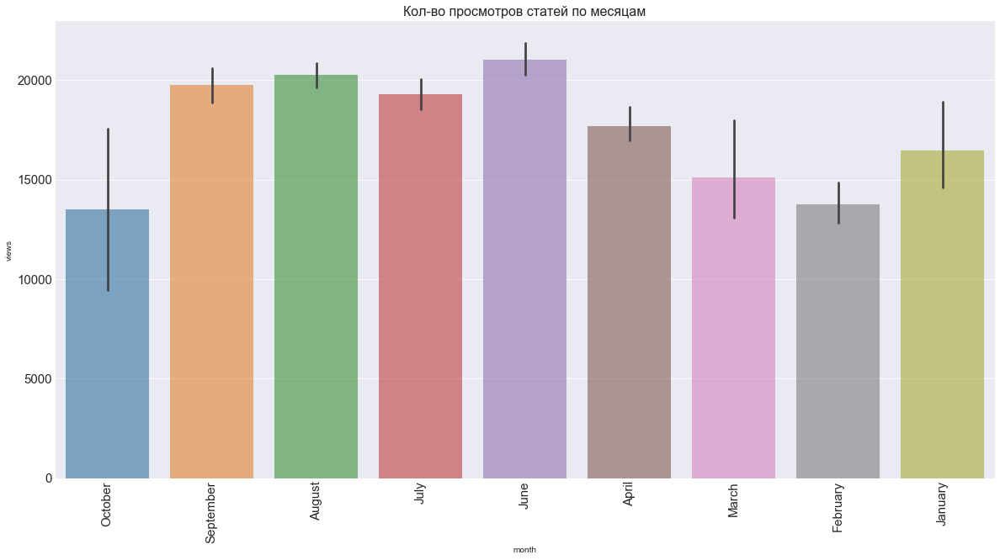

In [498]:

plt.figure(figsize=(20, 10))
plt.tick_params(labelsize=15)
plt.title("Кол-во просмотров статей по месяцам", fontsize=16)
plt.xticks(rotation='vertical')

sns.barplot(y=articles['views'], x=articles['month'], alpha=0.6, orient='v')
plt.show()

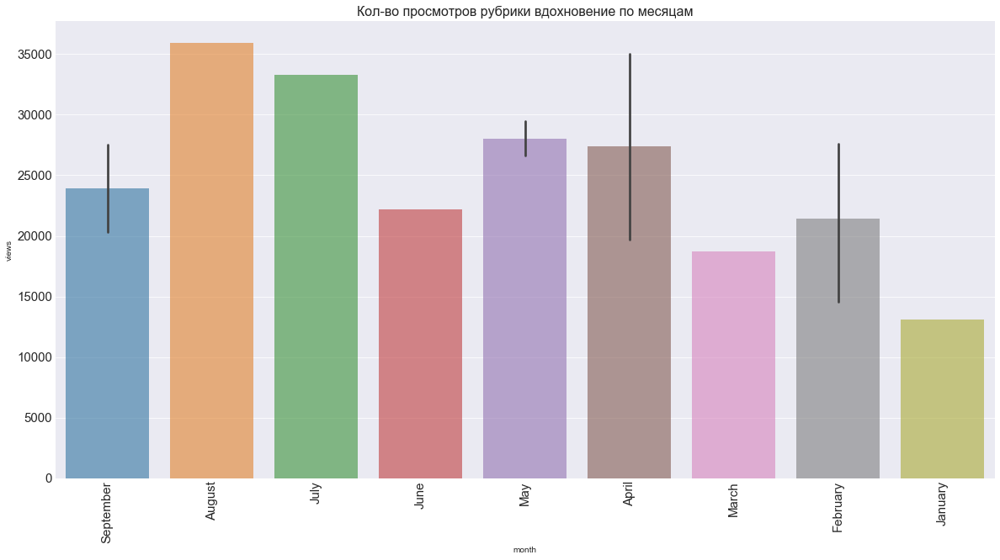

In [499]:

plt.figure(figsize=(20, 10))
plt.tick_params(labelsize=15)
plt.title("Кол-во просмотров рубрики вдохновение по месяцам", fontsize=16)
plt.xticks(rotation='vertical')

sns.barplot(y=inspiration['views'], x=inspiration['month'], alpha=0.6, orient='v')
plt.show()

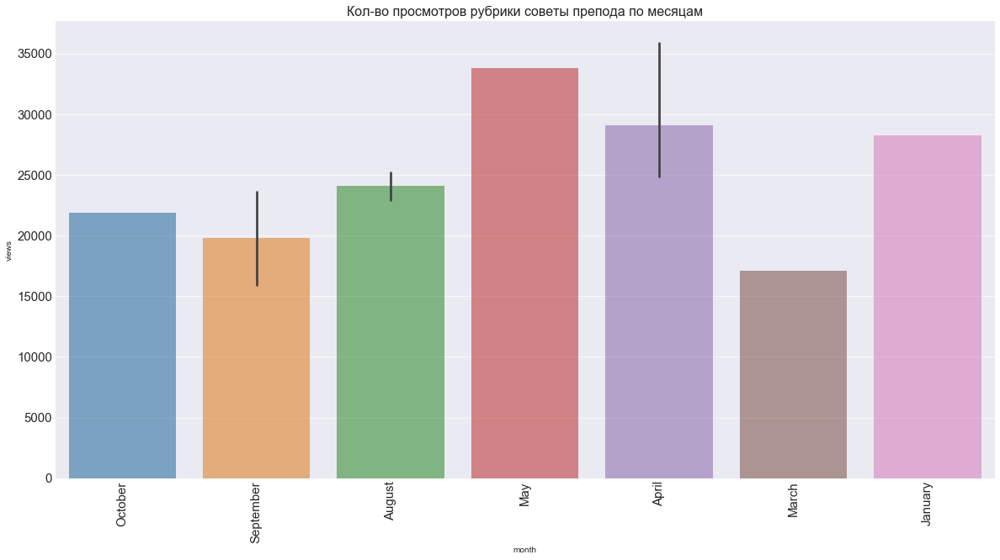

In [500]:

plt.figure(figsize=(20, 10))
plt.tick_params(labelsize=15)
plt.title("Кол-во просмотров рубрики советы препода по месяцам", fontsize=16)
plt.xticks(rotation='vertical')

sns.barplot(y=teacher['views'], x=teacher['month'], alpha=0.6, orient='v')
plt.show()

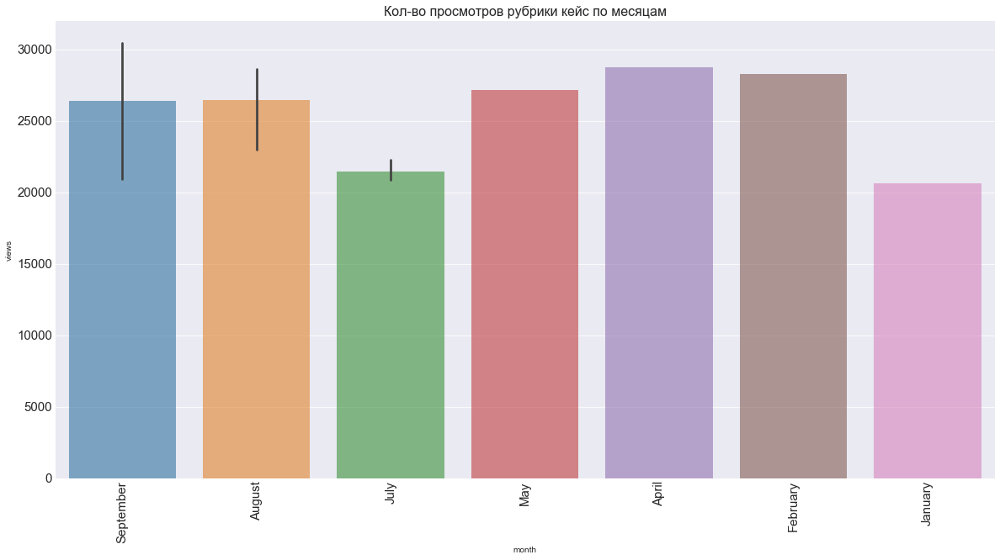

In [501]:

plt.figure(figsize=(20, 10))
plt.tick_params(labelsize=15)
plt.title("Кол-во просмотров рубрики кейс по месяцам", fontsize=16)
plt.xticks(rotation='vertical')

sns.barplot(y=case['views'], x=case['month'], alpha=0.6, orient='v')
plt.show()

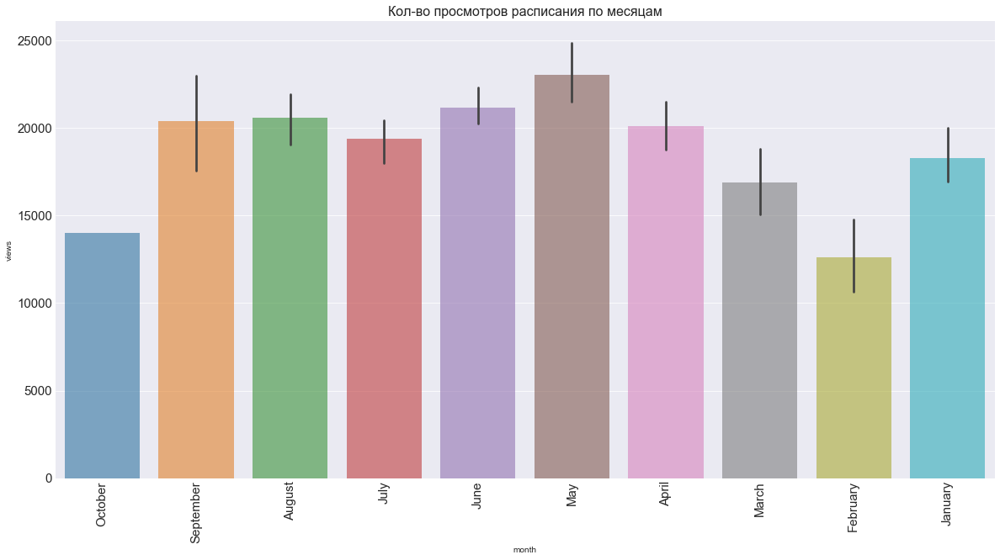

In [502]:

plt.figure(figsize=(20, 10))
plt.tick_params(labelsize=15)
plt.title("Кол-во просмотров расписания по месяцам", fontsize=16)
plt.xticks(rotation='vertical')

sns.barplot(y=timetable['views'], x=timetable['month'], alpha=0.6, orient='v')
plt.show()

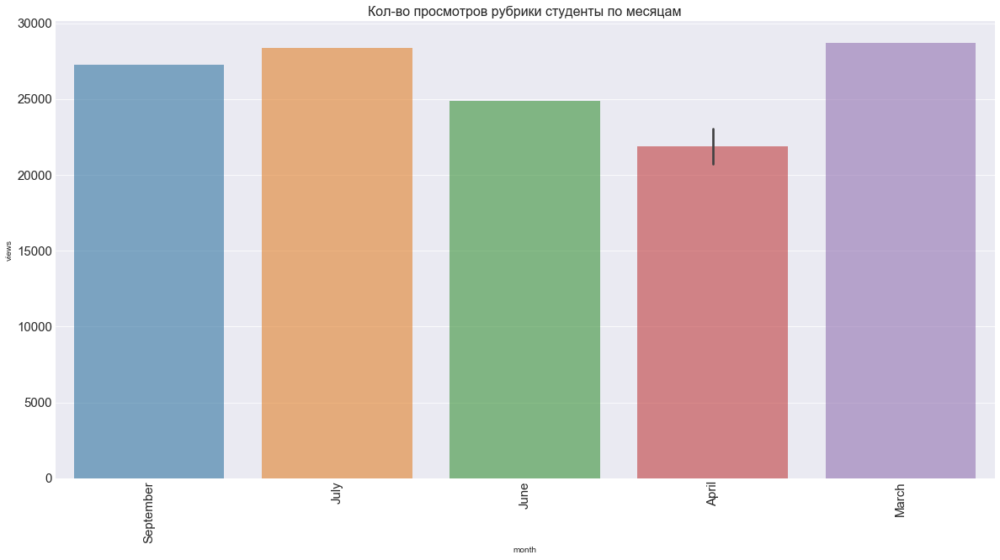

In [503]:

plt.figure(figsize=(20, 10))
plt.tick_params(labelsize=15)
plt.title("Кол-во просмотров рубрики студенты по месяцам", fontsize=16)
plt.xticks(rotation='vertical')

sns.barplot(y=students['views'], x=students['month'], alpha=0.6, orient='v')
plt.show()

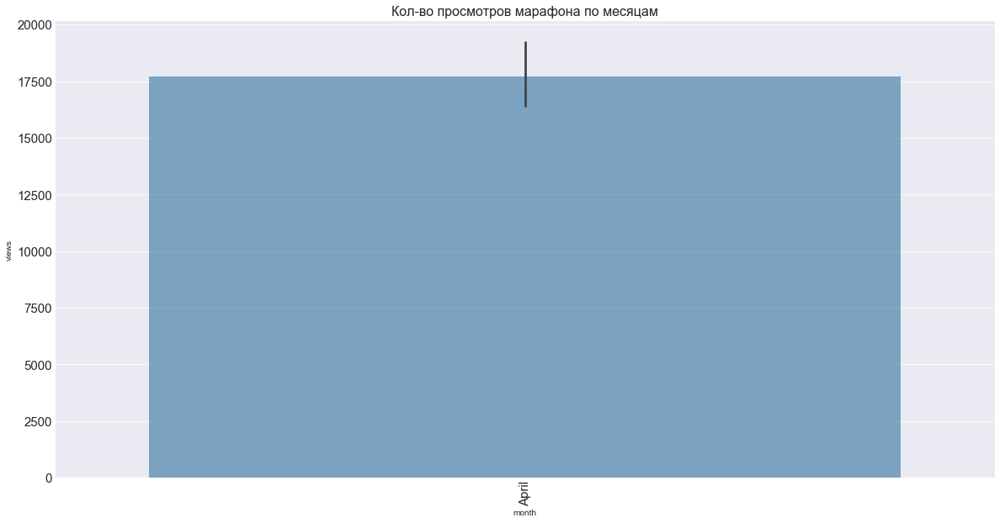

In [504]:

plt.figure(figsize=(20, 10))
plt.tick_params(labelsize=15)
plt.title("Кол-во просмотров марафона по месяцам", fontsize=16)
plt.xticks(rotation='vertical')

sns.barplot(y=marathon['views'], x=marathon['month'], alpha=0.6, orient='v')
plt.show()

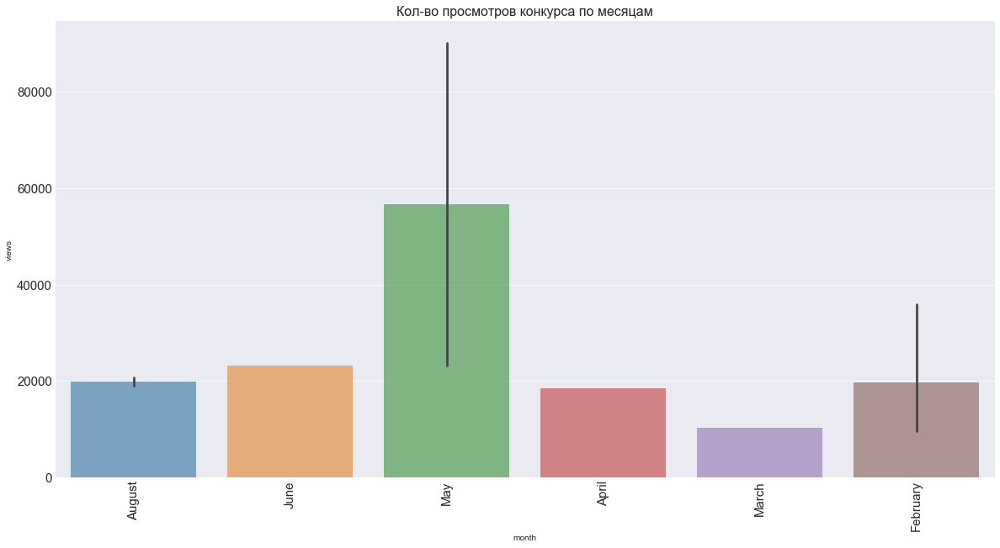

In [505]:

plt.figure(figsize=(20, 10))
plt.tick_params(labelsize=15)
plt.title("Кол-во просмотров конкурса по месяцам", fontsize=16)
plt.xticks(rotation='vertical')

sns.barplot(y=contests['views'], x=contests['month'], alpha=0.6, orient='v')
plt.show()

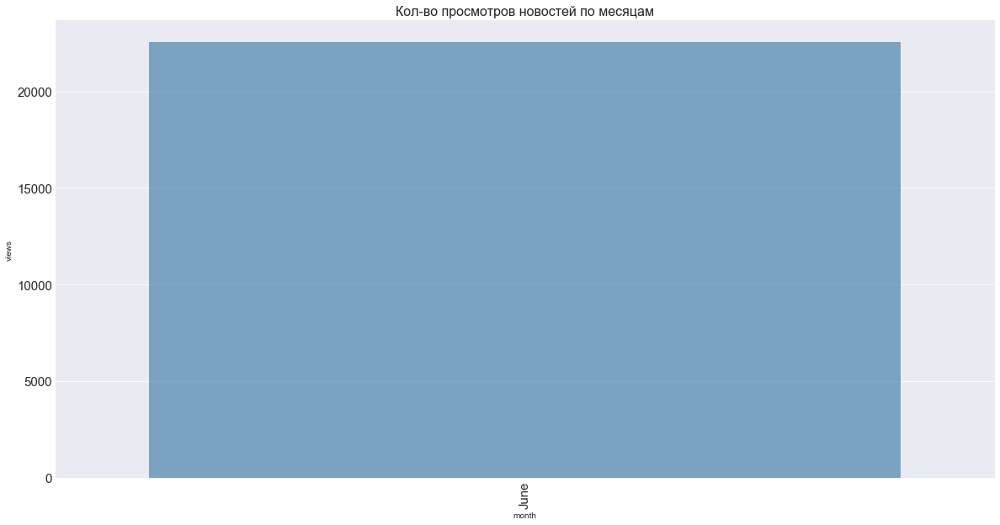

In [506]:

plt.figure(figsize=(20, 10))
plt.tick_params(labelsize=15)
plt.title("Кол-во просмотров новостей по месяцам", fontsize=16)
plt.xticks(rotation='vertical')

sns.barplot(y=news['views'], x=news['month'], alpha=0.6, orient='v')
plt.show()

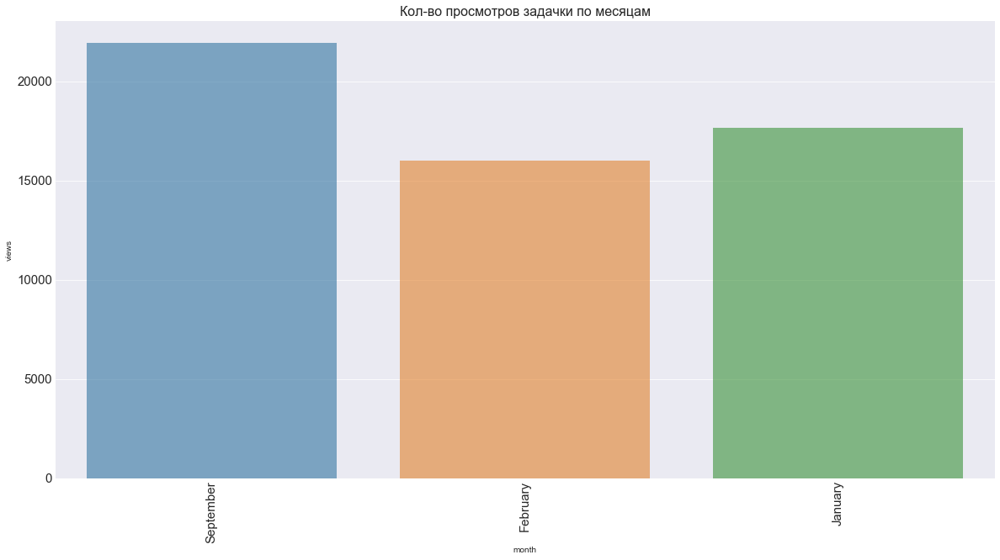

In [507]:

plt.figure(figsize=(20, 10))
plt.tick_params(labelsize=15)
plt.title("Кол-во просмотров задачки по месяцам", fontsize=16)
plt.xticks(rotation='vertical')

sns.barplot(y=task['views'], x=task['month'], alpha=0.6, orient='v')
plt.show()

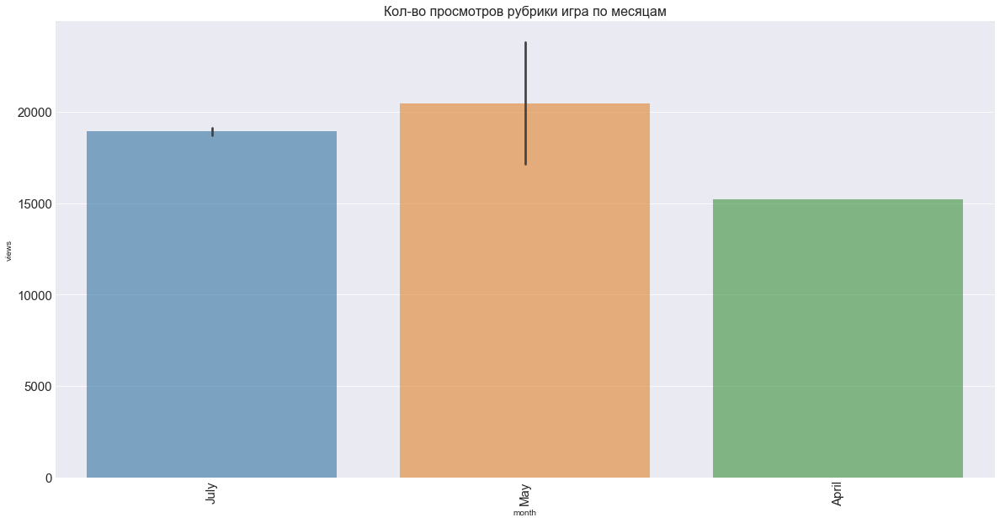

In [508]:

plt.figure(figsize=(20, 10))
plt.tick_params(labelsize=15)
plt.title("Кол-во просмотров рубрики игра по месяцам", fontsize=16)
plt.xticks(rotation='vertical')

sns.barplot(y=game['views'], x=game['month'], alpha=0.6, orient='v')
plt.show()

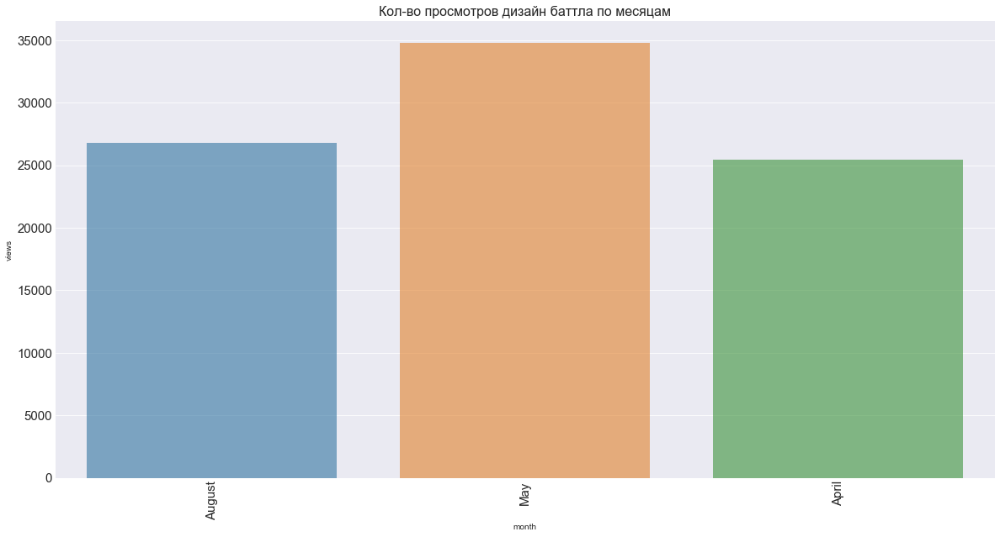

In [509]:

plt.figure(figsize=(20, 10))
plt.tick_params(labelsize=15)
plt.title("Кол-во просмотров дизайн баттла по месяцам", fontsize=16)
plt.xticks(rotation='vertical')

sns.barplot(y=battle['views'], x=battle['month'], alpha=0.6, orient='v')
plt.show()

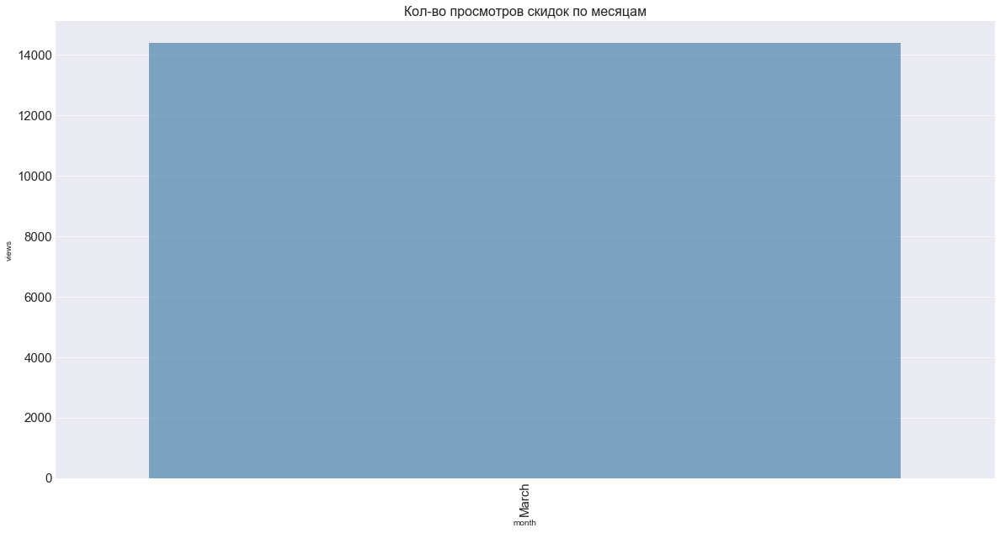

In [510]:

plt.figure(figsize=(20, 10))
plt.tick_params(labelsize=15)
plt.title("Кол-во просмотров скидок по месяцам", fontsize=16)
plt.xticks(rotation='vertical')

sns.barplot(y=discount['views'], x=discount['month'], alpha=0.6, orient='v')
plt.show()

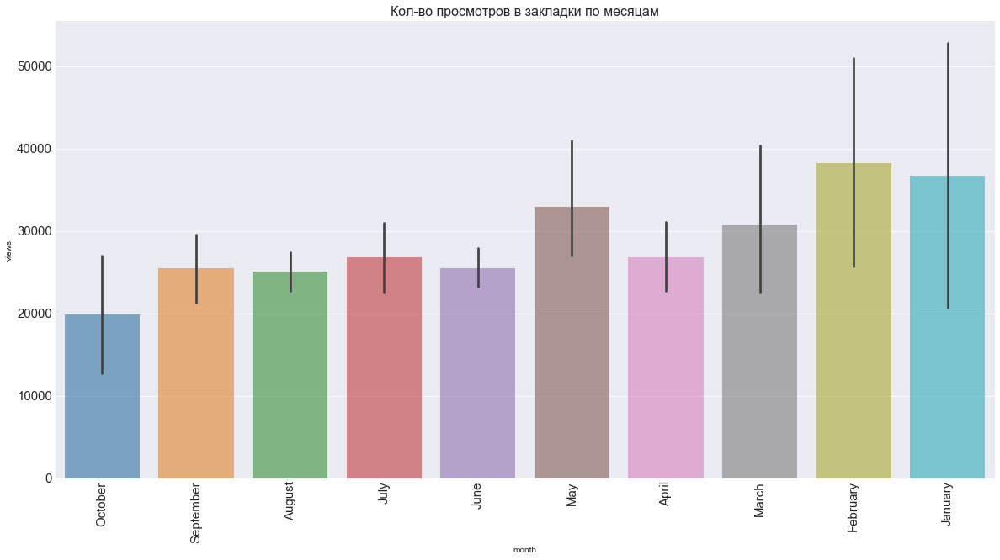

In [511]:

plt.figure(figsize=(20, 10))
plt.tick_params(labelsize=15)
plt.title("Кол-во просмотров в закладки по месяцам", fontsize=16)
plt.xticks(rotation='vertical')

sns.barplot(y=bookmark['views'], x=bookmark['month'], alpha=0.6, orient='v')
plt.show()

In [513]:
#делаем 4 графика на одной странице
f,ax=plt.subplots(1, 4, sharey=True, figsize=(30,15))

sns.barplot(x='views', y='month', data=design, alpha=0.6, ax=ax[0])
ax[0].set_title("Дизайн", fontsize=20)
ax[0].set_xlabel('Просмотры', fontsize=18)
ax[0].set_ylabel(None)
ax[0].tick_params(labelsize=16)

sns.barplot(x='views', y='month', data=programming, alpha=0.6, ax=ax[1])
ax[1].set_title("Программирование", fontsize=20)
ax[1].set_xlabel('Просмотры', fontsize=18)
ax[1].set_ylabel(None)
ax[1].tick_params(labelsize=16)

sns.barplot(x='views', y='month', data=marketing, alpha=0.6, ax=ax[2])
ax[2].set_title("Маркетинг", fontsize=20)
ax[2].set_xlabel('Просмотры', fontsize=18)
ax[2].set_ylabel(None)
ax[2].tick_params(labelsize=16)

sns.barplot(x='views', y='month', data=managemen, alpha=0.6, ax=ax[3])
ax[3].set_title("Управление", fontsize=20)
ax[3].set_xlabel('Просмотры', fontsize=18)
ax[3].set_ylabel(None)
ax[3].tick_params(labelsize=16)

plt.tight_layout()
plt.show()

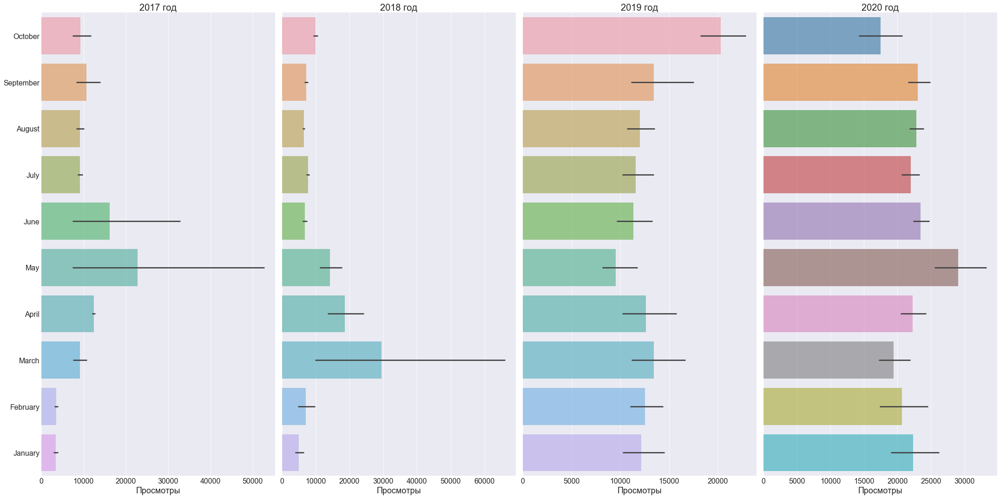

In [529]:
#дф по видам постов с помощью регулярных выражений фильтруем по вхождению

f,ax=plt.subplots(1, 4, sharey=True, figsize=(30,15))

sns.barplot(x='views', y='month', data=skillbox_posts_2017, alpha=0.6, ax=ax[0])
ax[0].set_title("2017 год", fontsize=20)
ax[0].set_xlabel('Просмотры', fontsize=18)
ax[0].set_ylabel(None)
ax[0].tick_params(labelsize=16)

sns.barplot(x='views', y='month', data=skillbox_posts_2018, alpha=0.6, ax=ax[1])
ax[1].set_title("2018 год", fontsize=20)
ax[1].set_xlabel('Просмотры', fontsize=18)
ax[1].set_ylabel(None)
ax[1].tick_params(labelsize=16)

sns.barplot(x='views', y='month', data=skillbox_posts_2019, alpha=0.6, ax=ax[2])
ax[2].set_title("2019 год", fontsize=20)
ax[2].set_xlabel('Просмотры', fontsize=18)
ax[2].set_ylabel(None)
ax[2].tick_params(labelsize=16)

sns.barplot(x='views', y='month', data=skillbox_posts_2020, alpha=0.6, ax=ax[3])
ax[3].set_title("2020 год", fontsize=20)
ax[3].set_xlabel('Просмотры', fontsize=18)
ax[3].set_ylabel(None)
ax[3].tick_params(labelsize=16)

plt.tight_layout()
plt.show()

> Рассматриваем более подробно именно 2020 год, так как он более актуальный 


> Данные по тегам 

* `Большее кол-во лайков (более 1000)` у тегов #Skillbox_Дизайн; #В_закладки_Skillbox, #Skillbox_Программирование; #В_закладки_Skillbox, #Skillbox_Управление; #В_закладки_Skillbox; #Skillbox_Дизайн, #В_закладки_Skillbox; #Skillbox_Маркетинг, #В_закладки_Skillbox; #Расписание_Skillbox; #Статья_Skillbox

* `Большее кол-во комментариев (более 400)` у тегов #Расписание_Skillbox; #Конкурс_Skillbox, #Skillbox_TED

* `Большее кол-во репостов (более 200)` у тегов #В_закладки_Skillbox, #Skillbox_Управление; #В_закладки_Skillbox; #Skillbox_Дизайн, #В_закладки_Skillbox; #Статья_Skillbox

* `Большее кол-во просмотром у тегов (выше 500000)` у тегов #Расписание_Skillbox; #Статья_Skillbox

>Данные по времени

* `Большее кол-во просмотров  (более 25000)` у публикаций 10, 12, 16 часов 

* `Большее кол-во комментариев` у публикаций  16 часов

* `Большее кол-во лайков  (более 125)` у публикаций 10, 11, 12, 16 часов 
 
* `Большее кол-во просмотров (более 25000)` у публикаций в субботу и воскресение 

* `Большее кол-во комментариев` у публикаций  в среду

* `Большее кол-во просмотров (более 20000)` у публикаций  июнь, август, сентябрь

> Данные по направлениям постов

* У рубрики `статьи` большее кол-во просмотров более 20000 июнь, меньшее менее 15000 февраль

* У рубрики `вдохновение` большее кол-во просмотров более 35000 август, меньшее менее 15000 январь

* У рубрики `советы` препода большее кол-во просмотров более 30000 май, меньшее менее 20000 март

* У рубрики `статьи` большее кол-во просмотров более 20000 июнь, меньшее менее 15000 февраль

* У рубрики `кейс` большее кол-во просмотров около 30000 апрель, меньшее около 20000 январь 

* У рубрики `расписание` большее кол-во просмотров более 20000 май, меньшее менее 15000 февраль

* У рубрики `студенты` большее кол-во просмотров около 30000 март, меньшее менее 25000 апрель

* `Марафон` был только в апреле

* У рубрики `конкурс` большее кол-во просмотров около 60000 май, меньшее менее 20000 март

* `Новости` были только в июне

* У рубрики `задачки` большее кол-во просмотров около 20000 сентябрь, меньшее около 15000 февраль

* У рубрики `игра` большее кол-во просмотров около 20000 май, меньшее около 15000 апрель

* У рубрики `дизайн баттл` большее кол-во просмотров около 35000 май, меньшее около 25000 август
 
* `Скидки` были только в марте
 
* У рубрики `закладки` большее кол-во просмотров около 50000 январь, меньшее менее 20000 октябрь

> Данные по направлению 

* Большее кол-во  просмотров по направлению `Управление` ( максимально  около 40000)

* Меньшее кол-во просмотров по направлению `Дизайн` ( максимально около 30000)

> Данные по годам 

* С `2019` года кол-во просмотров растёт

* В `2020 году` стабильно в каждом месяце просмотров в районе 20000



